In [1]:
import numpy as np
import pandas as pd
import random
import tensorflow as tf
from tensorflow import keras

In [2]:
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Multiply
from tensorflow.keras.layers import Add
from tensorflow.keras.layers import Subtract
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import Lambda
from tensorflow.keras import Model
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model

import os
import math

In [3]:
dataset = pd.read_csv('data/jd.csv')
dataset
'''
datetime: 
'''

'\ndatetime: \n'

In [4]:
train_data = dataset.head(int(len(dataset)*(80/100)))
train_data

,datetime,last_price,highest,lowest,bid_price1,bid_volume1,ask_price1,ask_volume1,volume,amount,open_interest
0,34:09.0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,24332
1,59:00.0,3800.0,3800.0,3800.0,3797.0,2,3800.0,16,22,836000,24335
2,00:00.4,3827.0,3830.0,3796.0,3803.0,5,3830.0,8,114,4341750,24367
3,00:00.9,3830.0,3839.0,3796.0,3830.0,6,3839.0,1,168,6412430,24359
4,00:01.4,3823.0,3839.0,3796.0,3824.0,1,3837.0,2,180,6872000,24358
...,...,...,...,...,...,...,...,...,...,...,...
838855,33:53.8,3670.0,3680.0,3652.0,3670.0,8,3671.0,112,63369,2323331800,229972
838856,33:54.2,3670.0,3680.0,3652.0,3670.0,18,3671.0,101,63376,2323588700,229970
838857,33:54.8,3671.0,3680.0,3652.0,3670.0,38,3671.0,87,63393,2324212750,229969
838858,33:55.3,3671.0,3680.0,3652.0,3671.0,24,3672.0,44,63490,2327773620,230003


In [5]:
test_data  = dataset.tail(int(len(dataset)*(20/100)))
test_data

,datetime,last_price,highest,lowest,bid_price1,bid_volume1,ask_price1,ask_volume1,volume,amount,open_interest
838860,33:56.3,3671.0,3680.0,3652.0,3671.0,23,3672.0,43,63493,2327883750,230002
838861,33:56.7,3671.0,3680.0,3652.0,3671.0,25,3672.0,43,63495,2327957170,230002
838862,33:57.3,3671.0,3680.0,3652.0,3671.0,25,3672.0,93,63495,2327957170,230002
838863,33:57.7,3671.0,3680.0,3652.0,3671.0,8,3672.0,93,63512,2328581240,230010
838864,33:58.3,3671.0,3680.0,3652.0,3671.0,7,3672.0,93,63513,2328617950,230010
...,...,...,...,...,...,...,...,...,...,...,...
1048570,24:38.5,3493.0,3502.0,3452.0,3492.0,15,3493.0,169,75536,2631885710,308715
1048571,24:39.0,3493.0,3502.0,3452.0,3492.0,18,3493.0,167,75539,2631990490,308717
1048572,24:39.5,3493.0,3502.0,3452.0,3492.0,20,3493.0,167,75539,2631990490,308717
1048573,24:39.9,3493.0,3502.0,3452.0,3492.0,22,3493.0,157,75549,2632339790,308718


In [6]:
dataset.max()


datetime             59:59.9
last_price              4463
highest                 4463
lowest                  4430
bid_price1              4459
bid_volume1             5647
ask_price1              4463
ask_volume1             8584
volume                399736
amount           14236279750
open_interest         317819
dtype: object

In [7]:
dataset.min()

datetime         00:00.0
last_price          3451
highest             3490
lowest              3451
bid_price1          3451
bid_volume1            0
ask_price1          3452
ask_volume1            0
volume                 0
amount                 0
open_interest      24332
dtype: object

In [8]:
dataset.dtypes

datetime          object
last_price       float64
highest          float64
lowest           float64
bid_price1       float64
bid_volume1        int64
ask_price1       float64
ask_volume1        int64
volume             int64
amount             int64
open_interest      int64
dtype: object

In [10]:
pd.isna(dataset.last_price)


0           True
1          False
2          False
3          False
4          False
           ...  
1048570    False
1048571    False
1048572    False
1048573    False
1048574    False
Name: last_price, Length: 1048575, dtype: bool

In [12]:
for row in dataset.iterrows():
    if math.isnan(row.last_price):
        print(row.datetime)

AttributeError: 'tuple' object has no attribute 'last_price'

TypeError: cannot convert the series to <class 'float'>

In [33]:
new_column = []
counter = -1;

for index, row in dataset.iterrows():
    if math.isnan(row['last_price']):
        counter+=1;
    new_column.append(counter)

dataset['day'] = new_column

In [35]:
dataset

,datetime,last_price,highest,lowest,bid_price1,bid_volume1,ask_price1,ask_volume1,volume,amount,open_interest,day
0,34:09.0,NaN,NaN,NaN,NaN,0,NaN,0,0,0,24332,0
1,59:00.0,3800.0,3800.0,3800.0,3797.0,2,3800.0,16,22,836000,24335,0
2,00:00.4,3827.0,3830.0,3796.0,3803.0,5,3830.0,8,114,4341750,24367,0
3,00:00.9,3830.0,3839.0,3796.0,3830.0,6,3839.0,1,168,6412430,24359,0
4,00:01.4,3823.0,3839.0,3796.0,3824.0,1,3837.0,2,180,6872000,24358,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,24:38.5,3493.0,3502.0,3452.0,3492.0,15,3493.0,169,75536,2631885710,308715,66
1048571,24:39.0,3493.0,3502.0,3452.0,3492.0,18,3493.0,167,75539,2631990490,308717,66
1048572,24:39.5,3493.0,3502.0,3452.0,3492.0,20,3493.0,167,75539,2631990490,308717,66
1048573,24:39.9,3493.0,3502.0,3452.0,3492.0,22,3493.0,157,75549,2632339790,308718,66


In [ ]:
# open interest 未平仓量 ask是买
# sharp ration 为奖励。
# 环境变量是starionalry的，
# 时间的interval在一个量级的，10分钟。
# forward selecting
# 先用binary
# 

In [36]:
import matplotlib.pyplot as plt

<function matplotlib.pyplot.show(*args, **kw)>

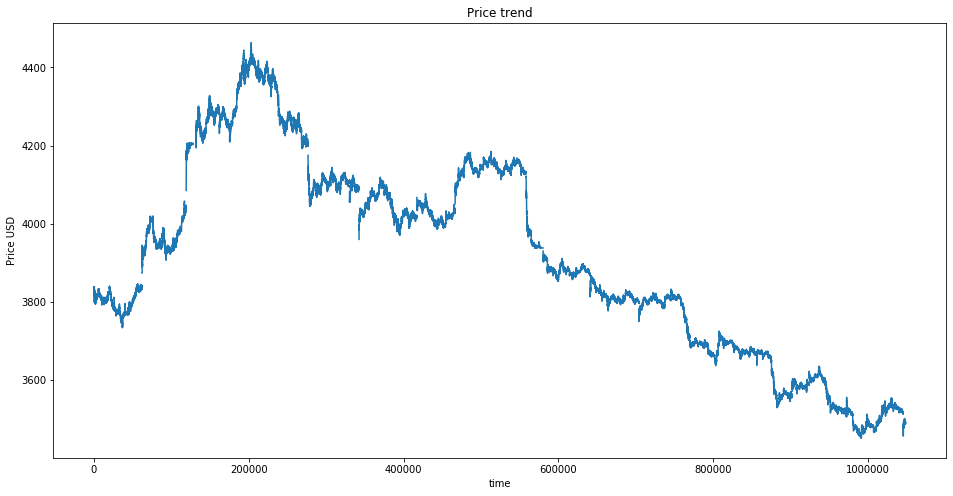

In [41]:
plt.figure(figsize=(16,8))
plt.title('Price trend')
plt.plot(dataset['ask_price1'])
plt.xlabel('time');
plt.ylabel('Price USD')
plt.show

In [86]:
ask_price = dataset.filter(['ask_price1'])
ask_price_array = ask_price.values
ask_price_array

array([[3800.],
       [3830.],
       [3839.],
       ...,
       [3493.],
       [3493.],
       [3493.]])

In [87]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
buying_price = scaler.fit_transform(ask_price_array)
buying_price


array([[0.34421365],
       [0.37388724],
       [0.38278932],
       ...,
       [0.04055391],
       [0.04055391],
       [0.04055391]])

<function matplotlib.pyplot.show(*args, **kw)>

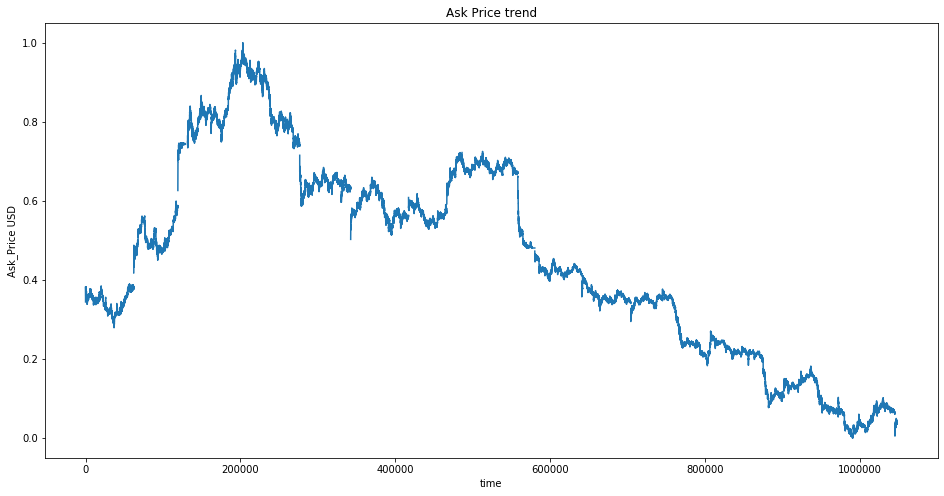

In [88]:
plt.figure(figsize=(16,8))
plt.title('Ask Price trend')
plt.plot(scaled_ask_price)
plt.xlabel('time');
plt.ylabel('Ask_Price USD')
plt.show

In [89]:
selling_price=scaler.fit_transform(dataset.filter(['bid_price1']).values)
selling_price

array([[0.34325397],
       [0.34920635],
       [0.37599206],
       ...,
       [0.0406746 ],
       [0.0406746 ],
       [0.0406746 ]])

<function matplotlib.pyplot.show(*args, **kw)>

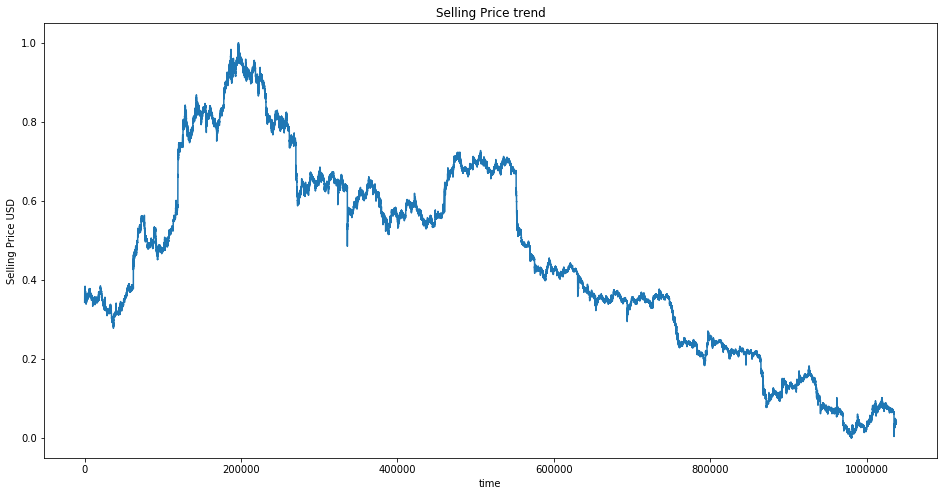

In [90]:
plt.figure(figsize=(16,8))
plt.title('Selling Price trend')
plt.plot(selling_price)
plt.xlabel('time');
plt.ylabel('Selling Price USD')
plt.show

In [65]:
dataset.describe()

,last_price,highest,lowest,bid_price1,bid_volume1,ask_price1,ask_volume1,volume,amount,open_interest,day
count,1.048508e+06,1.048508e+06,1.048508e+06,1.044578e+06,1.048575e+06,1.042020e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,3.913880e+03,3.944729e+03,3.885371e+03,3.913161e+03,6.414039e+01,3.912696e+03,5.658585e+01,8.121291e+04,3.084888e+09,1.360012e+05,3.849286e+01
std,2.504614e+02,2.531501e+02,2.419621e+02,2.508844e+02,3.052097e+02,2.502398e+02,3.073899e+02,7.302282e+04,2.644605e+09,8.473694e+04,1.822771e+01
min,3.451000e+03,3.490000e+03,3.451000e+03,3.451000e+03,0.000000e+00,3.452000e+03,0.000000e+00,0.000000e+00,0.000000e+00,2.433200e+04,0.000000e+00
25%,3.696000e+03,3.739000e+03,3.681000e+03,3.695000e+03,8.000000e+00,3.696000e+03,8.000000e+00,2.624300e+04,1.063270e+09,6.639400e+04,2.300000e+01
50%,3.901000e+03,3.933000e+03,3.874000e+03,3.895000e+03,2.200000e+01,3.894000e+03,2.100000e+01,5.843700e+04,2.332784e+09,1.108550e+05,4.200000e+01
75%,4.112000e+03,4.144000e+03,4.070000e+03,4.113000e+03,5.300000e+01,4.110000e+03,5.100000e+01,1.173720e+05,4.469870e+09,2.046490e+05,5.400000e+01
max,4.463000e+03,4.463000e+03,4.430000e+03,4.459000e+03,5.647000e+03,4.463000e+03,8.584000e+03,3.997360e+05,1.423628e+10,3.178190e+05,6.600000e+01


In [95]:
dataset = dataset.drop([ 'open_interest'],axis=1)

In [85]:
dataset = dataset.dropna(axis=0)

In [109]:
dataset = dataset.drop([ 'datetime'],axis=1)

In [104]:
length = len(selling_price)
length

1038090

In [100]:
dataset['selling_price'] = selling_price
dataset['buying_price'] = buying_price

In [107]:
# initialize state and set benchmarking model
total_prof=[]
done_flag=False
batch_size = 64
act_datasize = 0 #TODO


In [120]:
dataset.head()

,last_price,highest,lowest,bid_price1,bid_volume1,ask_price1,ask_volume1,day,selling_price,buying_price
1,3800.0,3800.0,3800.0,3797.0,2,3800.0,16,0,0.343254,0.344214
2,3827.0,3830.0,3796.0,3803.0,5,3830.0,8,0,0.349206,0.373887
3,3830.0,3839.0,3796.0,3830.0,6,3839.0,1,0,0.375992,0.382789
4,3823.0,3839.0,3796.0,3824.0,1,3837.0,2,0,0.370040,0.380811
5,3827.0,3839.0,3796.0,3824.0,1,3835.0,2,0,0.370040,0.378833


In [114]:
dataset_array = dataset.values
dataset_array.shape

(1038090, 10)

In [127]:
data_head_dic = {}
temp = list(dataset)
temp
for i in range (len(temp)) :
    data_head_dic[temp[i]]=i
data_head_dic


{'last_price': 0,
 'highest': 1,
 'lowest': 2,
 'bid_price1': 3,
 'bid_volume1': 4,
 'ask_price1': 5,
 'ask_volume1': 6,
 'day': 7,
 'selling_price': 8,
 'buying_price': 9}

In [118]:

def train(epoch):
    for e in range epoch:
        for i in dataset_array:
            data_in = i;
            print(data_in[])
train(2)

[3.80000000e+03 3.80000000e+03 3.80000000e+03 3.79700000e+03
 2.00000000e+00 3.80000000e+03 1.60000000e+01 0.00000000e+00
 3.43253968e-01 3.44213650e-01]
[3.82700000e+03 3.83000000e+03 3.79600000e+03 3.80300000e+03
 5.00000000e+00 3.83000000e+03 8.00000000e+00 0.00000000e+00
 3.49206349e-01 3.73887240e-01]
[3.83000000e+03 3.83900000e+03 3.79600000e+03 3.83000000e+03
 6.00000000e+00 3.83900000e+03 1.00000000e+00 0.00000000e+00
 3.75992063e-01 3.82789318e-01]
[3.82300000e+03 3.83900000e+03 3.79600000e+03 3.82400000e+03
 1.00000000e+00 3.83700000e+03 2.00000000e+00 0.00000000e+00
 3.70039683e-01 3.80811078e-01]
[3.82700000e+03 3.83900000e+03 3.79600000e+03 3.82400000e+03
 1.00000000e+00 3.83500000e+03 2.00000000e+00 0.00000000e+00
 3.70039683e-01 3.78832839e-01]
[3.82300000e+03 3.83900000e+03 3.79600000e+03 3.82300000e+03
 2.00000000e+00 3.82600000e+03 2.00000000e+00 0.00000000e+00
 3.69047619e-01 3.69930762e-01]
[3.82300000e+03 3.83900000e+03 3.79600000e+03 3.81400000e+03
 6.00000000e+00

 3.69047619e-01 3.67952522e-01]
[3.82300000e+03 3.83900000e+03 3.79600000e+03 3.82300000e+03
 2.00000000e+00 3.82400000e+03 2.00000000e+00 0.00000000e+00
 3.69047619e-01 3.67952522e-01]
[3.82300000e+03 3.83900000e+03 3.79600000e+03 3.82300000e+03
 1.00000000e+00 3.82400000e+03 2.00000000e+00 0.00000000e+00
 3.69047619e-01 3.67952522e-01]
[3.82300000e+03 3.83900000e+03 3.79600000e+03 3.82200000e+03
 1.70000000e+01 3.82400000e+03 1.00000000e+00 0.00000000e+00
 3.68055556e-01 3.67952522e-01]
[3.82400000e+03 3.83900000e+03 3.79600000e+03 3.82200000e+03
 1.70000000e+01 3.82500000e+03 2.00000000e+01 0.00000000e+00
 3.68055556e-01 3.68941642e-01]
[3.82400000e+03 3.83900000e+03 3.79600000e+03 3.82200000e+03
 1.60000000e+01 3.82500000e+03 2.10000000e+01 0.00000000e+00
 3.68055556e-01 3.68941642e-01]
[3.82400000e+03 3.83900000e+03 3.79600000e+03 3.82200000e+03
 1.70000000e+01 3.82500000e+03 2.10000000e+01 0.00000000e+00
 3.68055556e-01 3.68941642e-01]
[3.82200000e+03 3.83900000e+03 3.79600000e+0

 3.44246032e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+03 3.79800000e+03
 2.40000000e+01 3.79900000e+03 1.00000000e+00 0.00000000e+00
 3.44246032e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+03 3.79800000e+03
 1.80000000e+01 3.79900000e+03 5.00000000e+00 0.00000000e+00
 3.44246032e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+03 3.79800000e+03
 1.40000000e+01 3.79900000e+03 5.00000000e+00 0.00000000e+00
 3.44246032e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+03 3.79800000e+03
 1.00000000e+01 3.79900000e+03 3.00000000e+00 0.00000000e+00
 3.44246032e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+03 3.79600000e+03
 1.40000000e+01 3.79900000e+03 7.00000000e+00 0.00000000e+00
 3.42261905e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+03 3.79600000e+03
 1.30000000e+01 3.79900000e+03 7.00000000e+00 0.00000000e+00
 3.42261905e-01 3.43224530e-01]
[3.79800000e+03 3.83900000e+03 3.79500000e+0

 3.50198413e-01 3.49159248e-01]
[3.80500000e+03 3.83900000e+03 3.79300000e+03 3.80400000e+03
 8.00000000e+00 3.80600000e+03 3.00000000e+00 0.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80500000e+03 3.83900000e+03 3.79300000e+03 3.80400000e+03
 9.00000000e+00 3.80600000e+03 3.00000000e+00 0.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80500000e+03 3.83900000e+03 3.79300000e+03 3.80400000e+03
 8.00000000e+00 3.80600000e+03 3.00000000e+00 0.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80500000e+03 3.83900000e+03 3.79300000e+03 3.80400000e+03
 1.00000000e+00 3.80600000e+03 3.00000000e+00 0.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80600000e+03 3.83900000e+03 3.79300000e+03 3.80500000e+03
 6.00000000e+00 3.80700000e+03 2.00000000e+00 0.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80600000e+03 3.83900000e+03 3.79300000e+03 3.80500000e+03
 6.00000000e+00 3.80700000e+03 1.00000000e+00 0.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80600000e+03 3.83900000e+03 3.79300000e+0

 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+03 3.80700000e+03
 1.20000000e+01 3.80800000e+03 2.60000000e+01 0.00000000e+00
 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+03 3.80700000e+03
 1.10000000e+01 3.80800000e+03 2.60000000e+01 0.00000000e+00
 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+03 3.80700000e+03
 1.20000000e+01 3.80800000e+03 2.60000000e+01 0.00000000e+00
 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+03 3.80700000e+03
 1.10000000e+01 3.80800000e+03 2.60000000e+01 0.00000000e+00
 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+03 3.80700000e+03
 9.00000000e+00 3.80800000e+03 2.60000000e+01 0.00000000e+00
 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+03 3.80700000e+03
 8.00000000e+00 3.80800000e+03 2.60000000e+01 0.00000000e+00
 3.53174603e-01 3.52126607e-01]
[3.80700000e+03 3.83900000e+03 3.79300000e+0

 3.54166667e-01 3.54104847e-01]
[3.80900000e+03 3.83900000e+03 3.79300000e+03 3.80800000e+03
 9.00000000e+00 3.81000000e+03 3.90000000e+01 0.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80900000e+03 3.83900000e+03 3.79300000e+03 3.80800000e+03
 8.00000000e+00 3.81000000e+03 3.80000000e+01 0.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80900000e+03 3.83900000e+03 3.79300000e+03 3.80800000e+03
 8.00000000e+00 3.81000000e+03 3.90000000e+01 0.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80900000e+03 3.83900000e+03 3.79300000e+03 3.80800000e+03
 9.00000000e+00 3.81000000e+03 3.90000000e+01 0.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80900000e+03 3.83900000e+03 3.79300000e+03 3.80900000e+03
 2.00000000e+00 3.81000000e+03 3.90000000e+01 0.00000000e+00
 3.55158730e-01 3.54104847e-01]
[3.81000000e+03 3.83900000e+03 3.79300000e+03 3.80900000e+03
 1.60000000e+01 3.81000000e+03 3.50000000e+01 0.00000000e+00
 3.55158730e-01 3.54104847e-01]
[3.81000000e+03 3.83900000e+03 3.79300000e+0

 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+03 3.81400000e+03
 1.40000000e+01 3.81600000e+03 2.00000000e+00 0.00000000e+00
 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+03 3.81400000e+03
 2.00000000e+00 3.81600000e+03 2.00000000e+00 0.00000000e+00
 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+03 3.81400000e+03
 1.50000000e+01 3.81600000e+03 2.00000000e+00 0.00000000e+00
 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+03 3.81400000e+03
 1.40000000e+01 3.81600000e+03 2.00000000e+00 0.00000000e+00
 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+03 3.81400000e+03
 1.20000000e+01 3.81600000e+03 2.00000000e+00 0.00000000e+00
 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+03 3.81400000e+03
 2.60000000e+01 3.81600000e+03 2.00000000e+00 0.00000000e+00
 3.60119048e-01 3.60039565e-01]
[3.81500000e+03 3.83900000e+03 3.79300000e+0

 3.62103175e-01 3.63006924e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+03 3.81600000e+03
 6.00000000e+00 3.81900000e+03 1.00000000e+01 0.00000000e+00
 3.62103175e-01 3.63006924e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+03 3.81600000e+03
 7.00000000e+00 3.81900000e+03 9.00000000e+00 0.00000000e+00
 3.62103175e-01 3.63006924e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+03 3.81600000e+03
 6.00000000e+00 3.81900000e+03 1.00000000e+01 0.00000000e+00
 3.62103175e-01 3.63006924e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+03 3.81600000e+03
 7.00000000e+00 3.82000000e+03 6.10000000e+01 0.00000000e+00
 3.62103175e-01 3.63996044e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+03 3.81700000e+03
 1.00000000e+00 3.82000000e+03 6.10000000e+01 0.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+03 3.81700000e+03
 1.00000000e+00 3.81900000e+03 1.00000000e+00 0.00000000e+00
 3.63095238e-01 3.63006924e-01]
[3.81900000e+03 3.83900000e+03 3.79300000e+0

 3.74007937e-01 3.72898121e-01]
[3.82700000e+03 3.83900000e+03 3.79300000e+03 3.82800000e+03
 2.00000000e+00 3.83000000e+03 1.00000000e+00 0.00000000e+00
 3.74007937e-01 3.73887240e-01]
[3.82700000e+03 3.83900000e+03 3.79300000e+03 3.82800000e+03
 2.00000000e+00 3.83000000e+03 3.00000000e+00 0.00000000e+00
 3.74007937e-01 3.73887240e-01]
[3.8270000e+03 3.8390000e+03 3.7930000e+03 3.8290000e+03 2.0000000e+00
 3.8310000e+03 3.0000000e+00 0.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8270000e+03 3.8390000e+03 3.7930000e+03 3.8290000e+03 2.0000000e+00
 3.8310000e+03 2.0000000e+00 0.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.82700000e+03 3.83900000e+03 3.79300000e+03 3.83000000e+03
 2.00000000e+00 3.83100000e+03 2.00000000e+00 0.00000000e+00
 3.75992063e-01 3.74876360e-01]
[3.8300000e+03 3.8390000e+03 3.7930000e+03 3.8290000e+03 2.0000000e+00
 3.8300000e+03 4.0000000e+00 0.0000000e+00 3.7500000e-01 3.7388724e-01]
[3.83000000e+03 3.83900000e+03 3.79300000e+03 3.82800000e+03
 7.00000000e+00 

 3.61111111e-01 3.62017804e-01]
[3.81500000e+03 3.83200000e+03 3.81400000e+03 3.81700000e+03
 1.00000000e+01 3.81800000e+03 3.00000000e+00 1.00000000e+00
 3.63095238e-01 3.62017804e-01]
[3.81700000e+03 3.83200000e+03 3.81400000e+03 3.81700000e+03
 1.00000000e+00 3.81800000e+03 3.00000000e+00 1.00000000e+00
 3.63095238e-01 3.62017804e-01]
[3.81700000e+03 3.83200000e+03 3.81400000e+03 3.81500000e+03
 3.90000000e+01 3.81800000e+03 4.00000000e+00 1.00000000e+00
 3.61111111e-01 3.62017804e-01]
[3.81700000e+03 3.83200000e+03 3.81400000e+03 3.81500000e+03
 3.80000000e+01 3.81600000e+03 2.00000000e+00 1.00000000e+00
 3.61111111e-01 3.60039565e-01]
[3.81500000e+03 3.83200000e+03 3.81400000e+03 3.81500000e+03
 3.60000000e+01 3.81600000e+03 3.00000000e+00 1.00000000e+00
 3.61111111e-01 3.60039565e-01]
[3.81500000e+03 3.83200000e+03 3.81400000e+03 3.81500000e+03
 3.40000000e+01 3.81600000e+03 1.10000000e+01 1.00000000e+00
 3.61111111e-01 3.60039565e-01]
[3.81600000e+03 3.83200000e+03 3.81400000e+0

 3.63095238e-01 3.63996044e-01]
[3.81800000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 2.00000000e+00 3.82000000e+03 1.40000000e+01 1.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.81800000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 3.00000000e+00 3.82000000e+03 1.40000000e+01 1.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.81800000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 2.00000000e+00 3.82000000e+03 1.40000000e+01 1.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.81700000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 3.00000000e+00 3.82000000e+03 1.40000000e+01 1.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.82000000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 3.00000000e+00 3.82000000e+03 1.30000000e+01 1.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.82000000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 2.00000000e+00 3.81900000e+03 4.00000000e+00 1.00000000e+00
 3.63095238e-01 3.63006924e-01]
[3.81800000e+03 3.83200000e+03 3.81000000e+0

 3.62103175e-01 3.62017804e-01]
[3.81600000e+03 3.83200000e+03 3.81000000e+03 3.81600000e+03
 7.00000000e+00 3.81800000e+03 9.00000000e+00 1.00000000e+00
 3.62103175e-01 3.62017804e-01]
[3.81600000e+03 3.83200000e+03 3.81000000e+03 3.81600000e+03
 8.00000000e+00 3.81800000e+03 9.00000000e+00 1.00000000e+00
 3.62103175e-01 3.62017804e-01]
[3.81600000e+03 3.83200000e+03 3.81000000e+03 3.81600000e+03
 7.00000000e+00 3.81800000e+03 9.00000000e+00 1.00000000e+00
 3.62103175e-01 3.62017804e-01]
[3.81900000e+03 3.83200000e+03 3.81000000e+03 3.81700000e+03
 2.00000000e+00 3.82000000e+03 1.20000000e+01 1.00000000e+00
 3.63095238e-01 3.63996044e-01]
[3.81900000e+03 3.83200000e+03 3.81000000e+03 3.81800000e+03
 2.00000000e+00 3.82000000e+03 1.20000000e+01 1.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.83200000e+03 3.81000000e+03 3.81800000e+03
 2.00000000e+00 3.82000000e+03 1.10000000e+01 1.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.83200000e+03 3.81000000e+0

 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+03 3.80800000e+03
 6.00000000e+00 3.81000000e+03 1.90000000e+01 1.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+03 3.80800000e+03
 6.00000000e+00 3.81000000e+03 2.00000000e+01 1.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+03 3.80800000e+03
 6.00000000e+00 3.81000000e+03 2.10000000e+01 1.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+03 3.80800000e+03
 6.00000000e+00 3.81000000e+03 2.00000000e+01 1.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+03 3.80800000e+03
 6.00000000e+00 3.81000000e+03 1.90000000e+01 1.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+03 3.80800000e+03
 4.00000000e+00 3.81000000e+03 1.90000000e+01 1.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.80800000e+03 3.83200000e+03 3.80200000e+0

 3.57142857e-01 3.57072206e-01]
[3.81400000e+03 3.83200000e+03 3.80200000e+03 3.81100000e+03
 3.00000000e+00 3.81300000e+03 4.00000000e+00 1.00000000e+00
 3.57142857e-01 3.57072206e-01]
[3.81400000e+03 3.83200000e+03 3.80200000e+03 3.81100000e+03
 4.00000000e+00 3.81300000e+03 4.00000000e+00 1.00000000e+00
 3.57142857e-01 3.57072206e-01]
[3.81400000e+03 3.83200000e+03 3.80200000e+03 3.81200000e+03
 2.00000000e+00 3.81300000e+03 4.00000000e+00 1.00000000e+00
 3.58134921e-01 3.57072206e-01]
[3.81400000e+03 3.83200000e+03 3.80200000e+03 3.81200000e+03
 2.00000000e+00 3.81300000e+03 3.00000000e+00 1.00000000e+00
 3.58134921e-01 3.57072206e-01]
[3.81200000e+03 3.83200000e+03 3.80200000e+03 3.81200000e+03
 1.00000000e+00 3.81300000e+03 3.00000000e+00 1.00000000e+00
 3.58134921e-01 3.57072206e-01]
[3.81200000e+03 3.83200000e+03 3.80200000e+03 3.81100000e+03
 3.00000000e+00 3.81300000e+03 4.00000000e+00 1.00000000e+00
 3.57142857e-01 3.57072206e-01]
[3.81200000e+03 3.83200000e+03 3.80200000e+0

 3.40277778e-01 3.40257171e-01]
[3.79600000e+03 3.83200000e+03 3.78600000e+03 3.79600000e+03
 6.00000000e+00 3.79700000e+03 4.00000000e+00 1.00000000e+00
 3.42261905e-01 3.41246291e-01]
[3.79600000e+03 3.83200000e+03 3.78600000e+03 3.79600000e+03
 3.00000000e+00 3.79700000e+03 4.00000000e+00 1.00000000e+00
 3.42261905e-01 3.41246291e-01]
[3.79700000e+03 3.83200000e+03 3.78600000e+03 3.79400000e+03
 3.00000000e+00 3.79700000e+03 3.00000000e+00 1.00000000e+00
 3.40277778e-01 3.41246291e-01]
[3.79700000e+03 3.83200000e+03 3.78600000e+03 3.79400000e+03
 9.00000000e+00 3.79700000e+03 5.00000000e+00 1.00000000e+00
 3.40277778e-01 3.41246291e-01]
[3.79700000e+03 3.83200000e+03 3.78600000e+03 3.79400000e+03
 6.00000000e+00 3.79700000e+03 5.00000000e+00 1.00000000e+00
 3.40277778e-01 3.41246291e-01]
[3.79700000e+03 3.83200000e+03 3.78600000e+03 3.79400000e+03
 6.00000000e+00 3.79700000e+03 7.00000000e+00 1.00000000e+00
 3.40277778e-01 3.41246291e-01]
[3.79700000e+03 3.83200000e+03 3.78600000e+0

 3.49206349e-01 3.50148368e-01]
[3.80300000e+03 3.83200000e+03 3.78600000e+03 3.80300000e+03
 7.00000000e+00 3.80600000e+03 4.00000000e+00 1.00000000e+00
 3.49206349e-01 3.50148368e-01]
[3.80300000e+03 3.83200000e+03 3.78600000e+03 3.80300000e+03
 8.00000000e+00 3.80600000e+03 4.00000000e+00 1.00000000e+00
 3.49206349e-01 3.50148368e-01]
[3.80600000e+03 3.83200000e+03 3.78600000e+03 3.80300000e+03
 9.00000000e+00 3.80600000e+03 3.00000000e+00 1.00000000e+00
 3.49206349e-01 3.50148368e-01]
[3.80600000e+03 3.83200000e+03 3.78600000e+03 3.80400000e+03
 3.00000000e+00 3.80700000e+03 2.00000000e+00 1.00000000e+00
 3.50198413e-01 3.51137488e-01]
[3.80600000e+03 3.83200000e+03 3.78600000e+03 3.80400000e+03
 4.00000000e+00 3.80700000e+03 2.00000000e+00 1.00000000e+00
 3.50198413e-01 3.51137488e-01]
[3.80700000e+03 3.83200000e+03 3.78600000e+03 3.80400000e+03
 4.00000000e+00 3.80700000e+03 1.00000000e+00 1.00000000e+00
 3.50198413e-01 3.51137488e-01]
[3.80700000e+03 3.83200000e+03 3.78600000e+0

 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+03 3.80100000e+03
 6.00000000e+00 3.80200000e+03 3.00000000e+00 1.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+03 3.80100000e+03
 7.00000000e+00 3.80200000e+03 3.00000000e+00 1.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+03 3.80100000e+03
 8.00000000e+00 3.80200000e+03 3.00000000e+00 1.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+03 3.80100000e+03
 7.00000000e+00 3.80200000e+03 3.00000000e+00 1.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+03 3.80100000e+03
 8.00000000e+00 3.80200000e+03 3.00000000e+00 1.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+03 3.80100000e+03
 8.00000000e+00 3.80200000e+03 1.00000000e+00 1.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.83200000e+03 3.78600000e+0

[3.80800000e+03 3.81200000e+03 3.79200000e+03 3.80600000e+03
 4.00000000e+00 3.80900000e+03 2.10000000e+01 2.00000000e+00
 3.52182540e-01 3.53115727e-01]
[3.80800000e+03 3.81200000e+03 3.79200000e+03 3.80600000e+03
 1.00000000e+00 3.80800000e+03 7.00000000e+00 2.00000000e+00
 3.52182540e-01 3.52126607e-01]
[3.80600000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 2.70000000e+01 3.80800000e+03 7.00000000e+00 2.00000000e+00
 3.51190476e-01 3.52126607e-01]
[3.80600000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 1.30000000e+01 3.80800000e+03 7.00000000e+00 2.00000000e+00
 3.51190476e-01 3.52126607e-01]
[3.80600000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 2.60000000e+01 3.80800000e+03 7.00000000e+00 2.00000000e+00
 3.51190476e-01 3.52126607e-01]
[3.80600000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 1.30000000e+01 3.80800000e+03 7.00000000e+00 2.00000000e+00
 3.51190476e-01 3.52126607e-01]
[3.80600000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 2.60000000e+01

 3.46230159e-01 3.45202770e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.00000000e+00 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+03 3.80000000e+03
 6.00000000e+00 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.46230159e-01 3.46191889e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+03 3.80000000e+03
 4.00000000e+00 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.46230159e-01 3.46191889e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+03 3.80000000e+03
 3.00000000e+00 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.46230159e-01 3.46191889e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+03 3.79900000e+03
 1.00000000e+00 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.45238095e-01 3.46191889e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+03 3.79900000e+03
 6.00000000e+00 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.45238095e-01 3.46191889e-01]
[3.80100000e+03 3.81200000e+03 3.79200000e+0

 3.50198413e-01 3.50148368e-01]
[3.80500000e+03 3.81200000e+03 3.79200000e+03 3.80400000e+03
 3.00000000e+00 3.80600000e+03 3.00000000e+00 2.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80400000e+03 3.81200000e+03 3.79200000e+03 3.80300000e+03
 5.00000000e+00 3.80400000e+03 2.00000000e+00 2.00000000e+00
 3.49206349e-01 3.48170129e-01]
[3.80400000e+03 3.81200000e+03 3.79200000e+03 3.80400000e+03
 2.00000000e+00 3.80600000e+03 5.00000000e+00 2.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80400000e+03 3.81200000e+03 3.79200000e+03 3.80400000e+03
 2.00000000e+00 3.80600000e+03 7.00000000e+00 2.00000000e+00
 3.50198413e-01 3.50148368e-01]
[3.80400000e+03 3.81200000e+03 3.79200000e+03 3.80300000e+03
 3.00000000e+00 3.80500000e+03 1.00000000e+01 2.00000000e+00
 3.49206349e-01 3.49159248e-01]
[3.80400000e+03 3.81200000e+03 3.79200000e+03 3.80300000e+03
 2.00000000e+00 3.80500000e+03 1.00000000e+01 2.00000000e+00
 3.49206349e-01 3.49159248e-01]
[3.80400000e+03 3.81200000e+03 3.79200000e+0

[3.80700000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 3.00000000e+00 3.80700000e+03 6.00000000e+00 2.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80700000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 3.00000000e+00 3.80700000e+03 1.10000000e+01 2.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80700000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 3.00000000e+00 3.80700000e+03 6.00000000e+00 2.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80700000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 4.00000000e+00 3.80700000e+03 6.00000000e+00 2.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80700000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 3.00000000e+00 3.80700000e+03 6.00000000e+00 2.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80700000e+03 3.81200000e+03 3.79200000e+03 3.80500000e+03
 3.00000000e+00 3.80700000e+03 1.00000000e+00 2.00000000e+00
 3.51190476e-01 3.51137488e-01]
[3.80500000e+03 3.81200000e+03 3.79200000e+03 3.80400000e+03
 4.00000000e+00

 3.44246032e-01 3.44213650e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+03 3.79800000e+03
 1.00000000e+00 3.80000000e+03 1.00000000e+01 2.00000000e+00
 3.44246032e-01 3.44213650e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+03 3.79700000e+03
 1.90000000e+01 3.79800000e+03 4.00000000e+00 2.00000000e+00
 3.43253968e-01 3.42235410e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+03 3.79700000e+03
 1.70000000e+01 3.79800000e+03 4.00000000e+00 2.00000000e+00
 3.43253968e-01 3.42235410e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+03 3.79800000e+03
 1.00000000e+00 3.80000000e+03 1.10000000e+01 2.00000000e+00
 3.44246032e-01 3.44213650e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+03 3.79800000e+03
 2.00000000e+00 3.80000000e+03 1.10000000e+01 2.00000000e+00
 3.44246032e-01 3.44213650e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+03 3.79700000e+03
 1.20000000e+01 3.79800000e+03 2.00000000e+00 2.00000000e+00
 3.43253968e-01 3.42235410e-01]
[3.79800000e+03 3.81200000e+03 3.79200000e+0

 3.45238095e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+03 3.80000000e+03
 2.00000000e+00 3.80100000e+03 6.00000000e+00 2.00000000e+00
 3.46230159e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+03 3.80000000e+03
 2.00000000e+00 3.80100000e+03 8.00000000e+00 2.00000000e+00
 3.46230159e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+03 3.79900000e+03
 1.30000000e+01 3.80100000e+03 8.00000000e+00 2.00000000e+00
 3.45238095e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+03 3.79900000e+03
 1.30000000e+01 3.80100000e+03 9.00000000e+00 2.00000000e+00
 3.45238095e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+03 3.79900000e+03
 1.40000000e+01 3.80100000e+03 9.00000000e+00 2.00000000e+00
 3.45238095e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+03 3.79900000e+03
 1.30000000e+01 3.80100000e+03 9.00000000e+00 2.00000000e+00
 3.45238095e-01 3.45202770e-01]
[3.80000000e+03 3.81200000e+03 3.79200000e+0

 3.48214286e-01 3.48170129e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.10000000e+01 3.80200000e+03 4.00000000e+00 2.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.10000000e+01 3.80200000e+03 3.00000000e+00 2.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.10000000e+01 3.80200000e+03 1.00000000e+00 2.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.20000000e+01 3.80200000e+03 1.00000000e+00 2.00000000e+00
 3.47222222e-01 3.46191889e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.20000000e+01 3.80300000e+03 3.00000000e+00 2.00000000e+00
 3.47222222e-01 3.47181009e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+03 3.80100000e+03
 1.20000000e+01 3.80300000e+03 2.00000000e+00 2.00000000e+00
 3.47222222e-01 3.47181009e-01]
[3.80200000e+03 3.81200000e+03 3.79200000e+0

 3.65079365e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+03 3.81800000e+03
 1.30000000e+01 3.82000000e+03 5.00000000e+00 2.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+03 3.81800000e+03
 1.40000000e+01 3.82000000e+03 5.00000000e+00 2.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+03 3.81800000e+03
 1.30000000e+01 3.82000000e+03 5.00000000e+00 2.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+03 3.81800000e+03
 1.40000000e+01 3.82000000e+03 5.00000000e+00 2.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+03 3.81800000e+03
 2.20000000e+01 3.82000000e+03 5.00000000e+00 2.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+03 3.81800000e+03
 2.20000000e+01 3.82000000e+03 4.00000000e+00 2.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.82000000e+03 3.82000000e+03 3.79200000e+0

 3.58134921e-01 3.58061325e-01]
[3.81500000e+03 3.82400000e+03 3.80200000e+03 3.81200000e+03
 1.10000000e+01 3.81400000e+03 3.00000000e+00 3.00000000e+00
 3.58134921e-01 3.58061325e-01]
[3.81500000e+03 3.82400000e+03 3.80200000e+03 3.81200000e+03
 8.00000000e+00 3.81400000e+03 3.00000000e+00 3.00000000e+00
 3.58134921e-01 3.58061325e-01]
[3.81500000e+03 3.82400000e+03 3.80200000e+03 3.81200000e+03
 1.20000000e+01 3.81400000e+03 3.00000000e+00 3.00000000e+00
 3.58134921e-01 3.58061325e-01]
[3.81500000e+03 3.82400000e+03 3.80200000e+03 3.81200000e+03
 1.10000000e+01 3.81400000e+03 3.00000000e+00 3.00000000e+00
 3.58134921e-01 3.58061325e-01]
[3.81500000e+03 3.82400000e+03 3.80200000e+03 3.81300000e+03
 1.00000000e+00 3.81400000e+03 3.00000000e+00 3.00000000e+00
 3.59126984e-01 3.58061325e-01]
[3.81500000e+03 3.82400000e+03 3.80200000e+03 3.81300000e+03
 1.00000000e+00 3.81400000e+03 2.00000000e+00 3.00000000e+00
 3.59126984e-01 3.58061325e-01]
[3.81400000e+03 3.82400000e+03 3.80200000e+0

 3.66071429e-01 3.64985163e-01]
[3.82000000e+03 3.82400000e+03 3.80200000e+03 3.82000000e+03
 3.00000000e+00 3.82100000e+03 1.90000000e+01 3.00000000e+00
 3.66071429e-01 3.64985163e-01]
[3.82000000e+03 3.82400000e+03 3.80200000e+03 3.82000000e+03
 2.00000000e+00 3.82100000e+03 1.80000000e+01 3.00000000e+00
 3.66071429e-01 3.64985163e-01]
[3.82000000e+03 3.82400000e+03 3.80200000e+03 3.82000000e+03
 1.00000000e+00 3.82100000e+03 1.80000000e+01 3.00000000e+00
 3.66071429e-01 3.64985163e-01]
[3.82100000e+03 3.82400000e+03 3.80200000e+03 3.82000000e+03
 2.00000000e+00 3.82100000e+03 1.70000000e+01 3.00000000e+00
 3.66071429e-01 3.64985163e-01]
[3.82100000e+03 3.82400000e+03 3.80200000e+03 3.82000000e+03
 1.10000000e+01 3.82100000e+03 1.70000000e+01 3.00000000e+00
 3.66071429e-01 3.64985163e-01]
[3.82000000e+03 3.82400000e+03 3.80200000e+03 3.82000000e+03
 2.30000000e+01 3.82100000e+03 1.70000000e+01 3.00000000e+00
 3.66071429e-01 3.64985163e-01]
[3.82000000e+03 3.82400000e+03 3.80200000e+0

[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82400000e+03
 3.00000000e+00 3.82600000e+03 2.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82400000e+03
 4.10000000e+01 3.82600000e+03 2.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82500000e+03
 3.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.71031746e-01 3.69930762e-01]
[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82500000e+03
 4.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.71031746e-01 3.69930762e-01]
[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82400000e+03
 3.00000000e+00 3.82500000e+03 5.00000000e+00 3.00000000e+00
 3.70039683e-01 3.68941642e-01]
[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82400000e+03
 3.00000000e+00 3.82600000e+03 5.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.82500000e+03 3.80200000e+03 3.82400000e+03
 3.00000000e+00

 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84000000e+03 3.80200000e+03 3.82700000e+03
 1.10000000e+01 3.82800000e+03 3.00000000e+00 3.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84000000e+03 3.80200000e+03 3.82700000e+03
 1.10000000e+01 3.82800000e+03 8.00000000e+00 3.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84000000e+03 3.80200000e+03 3.82700000e+03
 1.10000000e+01 3.82800000e+03 1.30000000e+01 3.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84000000e+03 3.80200000e+03 3.82700000e+03
 1.40000000e+01 3.82800000e+03 1.30000000e+01 3.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82800000e+03 3.84000000e+03 3.80200000e+03 3.82700000e+03
 1.40000000e+01 3.82800000e+03 1.20000000e+01 3.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82800000e+03 3.84000000e+03 3.80200000e+03 3.82700000e+03
 1.50000000e+01 3.82800000e+03 1.20000000e+01 3.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82800000e+03 3.84000000e+03 3.80200000e+0

 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.84000000e+03 3.80200000e+03 3.82400000e+03
 3.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.84000000e+03 3.80200000e+03 3.82400000e+03
 2.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.84000000e+03 3.80200000e+03 3.82400000e+03
 7.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.84000000e+03 3.80200000e+03 3.82400000e+03
 3.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82500000e+03 3.84000000e+03 3.80200000e+03 3.82400000e+03
 7.00000000e+00 3.82600000e+03 3.00000000e+00 3.00000000e+00
 3.70039683e-01 3.69930762e-01]
[3.82600000e+03 3.84000000e+03 3.80200000e+03 3.82500000e+03
 1.00000000e+00 3.82600000e+03 2.00000000e+00 3.00000000e+00
 3.71031746e-01 3.69930762e-01]
[3.82500000e+03 3.84000000e+03 3.80200000e+0

 3.59126984e-01 3.59050445e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+03 3.81300000e+03
 2.00000000e+00 3.81600000e+03 3.00000000e+00 3.00000000e+00
 3.59126984e-01 3.60039565e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+03 3.81300000e+03
 4.00000000e+00 3.81600000e+03 3.00000000e+00 3.00000000e+00
 3.59126984e-01 3.60039565e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+03 3.81300000e+03
 4.00000000e+00 3.81600000e+03 1.00000000e+00 3.00000000e+00
 3.59126984e-01 3.60039565e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+03 3.81300000e+03
 4.00000000e+00 3.81600000e+03 2.00000000e+00 3.00000000e+00
 3.59126984e-01 3.60039565e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+03 3.81300000e+03
 5.00000000e+00 3.81600000e+03 2.00000000e+00 3.00000000e+00
 3.59126984e-01 3.60039565e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+03 3.81300000e+03
 5.00000000e+00 3.81600000e+03 1.00000000e+00 3.00000000e+00
 3.59126984e-01 3.60039565e-01]
[3.81500000e+03 3.84000000e+03 3.80200000e+0

 3.48214286e-01 3.47181009e-01]
[3.80200000e+03 3.84000000e+03 3.80100000e+03 3.80200000e+03
 4.00000000e+01 3.80300000e+03 1.00000000e+00 3.00000000e+00
 3.48214286e-01 3.47181009e-01]
[3.80300000e+03 3.84000000e+03 3.80100000e+03 3.80300000e+03
 1.00000000e+00 3.80400000e+03 1.00000000e+01 3.00000000e+00
 3.49206349e-01 3.48170129e-01]
[3.80300000e+03 3.84000000e+03 3.80100000e+03 3.80200000e+03
 4.00000000e+01 3.80400000e+03 1.00000000e+01 3.00000000e+00
 3.48214286e-01 3.48170129e-01]
[3.80300000e+03 3.84000000e+03 3.80100000e+03 3.80200000e+03
 4.00000000e+01 3.80400000e+03 7.00000000e+00 3.00000000e+00
 3.48214286e-01 3.48170129e-01]
[3.80300000e+03 3.84000000e+03 3.80100000e+03 3.80200000e+03
 4.00000000e+01 3.80300000e+03 1.00000000e+00 3.00000000e+00
 3.48214286e-01 3.47181009e-01]
[3.80300000e+03 3.84000000e+03 3.80100000e+03 3.80200000e+03
 4.00000000e+01 3.80300000e+03 5.00000000e+00 3.00000000e+00
 3.48214286e-01 3.47181009e-01]
[3.80300000e+03 3.84000000e+03 3.80100000e+0

 3.41269841e-01 3.41246291e-01]
[3.79600000e+03 3.84000000e+03 3.78800000e+03 3.79500000e+03
 3.00000000e+00 3.79700000e+03 1.20000000e+01 3.00000000e+00
 3.41269841e-01 3.41246291e-01]
[3.79600000e+03 3.84000000e+03 3.78800000e+03 3.79500000e+03
 2.00000000e+00 3.79700000e+03 1.20000000e+01 3.00000000e+00
 3.41269841e-01 3.41246291e-01]
[3.79600000e+03 3.84000000e+03 3.78800000e+03 3.79500000e+03
 2.00000000e+00 3.79700000e+03 1.30000000e+01 3.00000000e+00
 3.41269841e-01 3.41246291e-01]
[3.79600000e+03 3.84000000e+03 3.78800000e+03 3.79500000e+03
 2.00000000e+00 3.79700000e+03 1.20000000e+01 3.00000000e+00
 3.41269841e-01 3.41246291e-01]
[3.79700000e+03 3.84000000e+03 3.78800000e+03 3.79700000e+03
 3.00000000e+00 3.79800000e+03 1.20000000e+01 3.00000000e+00
 3.43253968e-01 3.42235410e-01]
[3.79700000e+03 3.84000000e+03 3.78800000e+03 3.79500000e+03
 2.00000000e+00 3.79700000e+03 1.00000000e+00 3.00000000e+00
 3.41269841e-01 3.41246291e-01]
[3.79700000e+03 3.84000000e+03 3.78800000e+0

 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+03 3.79200000e+03
 5.00000000e+00 3.79500000e+03 6.00000000e+00 3.00000000e+00
 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+03 3.79200000e+03
 5.00000000e+00 3.79500000e+03 7.00000000e+00 3.00000000e+00
 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+03 3.79200000e+03
 6.00000000e+00 3.79500000e+03 7.00000000e+00 3.00000000e+00
 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+03 3.79200000e+03
 4.00000000e+00 3.79500000e+03 7.00000000e+00 3.00000000e+00
 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+03 3.79200000e+03
 4.00000000e+00 3.79500000e+03 6.00000000e+00 3.00000000e+00
 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+03 3.79200000e+03
 6.00000000e+00 3.79500000e+03 7.00000000e+00 3.00000000e+00
 3.38293651e-01 3.39268051e-01]
[3.79300000e+03 3.84000000e+03 3.78800000e+0

 3.29365079e-01 3.29376855e-01]
[3.78500000e+03 3.84000000e+03 3.77900000e+03 3.78400000e+03
 1.00000000e+00 3.78500000e+03 1.30000000e+01 3.00000000e+00
 3.30357143e-01 3.29376855e-01]
[3.78500000e+03 3.84000000e+03 3.77900000e+03 3.78400000e+03
 1.00000000e+00 3.78500000e+03 1.40000000e+01 3.00000000e+00
 3.30357143e-01 3.29376855e-01]
[3.78500000e+03 3.84000000e+03 3.77900000e+03 3.78400000e+03
 1.00000000e+00 3.78500000e+03 1.30000000e+01 3.00000000e+00
 3.30357143e-01 3.29376855e-01]
[3.78500000e+03 3.84000000e+03 3.77900000e+03 3.78400000e+03
 1.00000000e+00 3.78500000e+03 1.40000000e+01 3.00000000e+00
 3.30357143e-01 3.29376855e-01]
[3.78500000e+03 3.84000000e+03 3.77900000e+03 3.78400000e+03
 2.00000000e+00 3.78500000e+03 1.40000000e+01 3.00000000e+00
 3.30357143e-01 3.29376855e-01]
[3.78500000e+03 3.84000000e+03 3.77900000e+03 3.78400000e+03
 2.00000000e+00 3.78500000e+03 1.30000000e+01 3.00000000e+00
 3.30357143e-01 3.29376855e-01]
[3.78400000e+03 3.84000000e+03 3.77900000e+0

 3.26388889e-01 3.27398615e-01]
[3.78000000e+03 3.84000000e+03 3.77800000e+03 3.78000000e+03
 1.20000000e+01 3.78200000e+03 4.00000000e+00 3.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78000000e+03 3.84000000e+03 3.77800000e+03 3.78000000e+03
 1.10000000e+01 3.78200000e+03 4.00000000e+00 3.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78000000e+03 3.84000000e+03 3.77800000e+03 3.78000000e+03
 1.00000000e+01 3.78200000e+03 4.00000000e+00 3.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78000000e+03 3.84000000e+03 3.77800000e+03 3.78000000e+03
 1.20000000e+01 3.78200000e+03 4.00000000e+00 3.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78000000e+03 3.84000000e+03 3.77800000e+03 3.78000000e+03
 1.30000000e+01 3.78200000e+03 4.00000000e+00 3.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78200000e+03 3.84000000e+03 3.77800000e+03 3.78200000e+03
 1.00000000e+00 3.78300000e+03 2.00000000e+00 3.00000000e+00
 3.28373016e-01 3.27398615e-01]
[3.78100000e+03 3.84000000e+03 3.77800000e+0

 3.27380952e-01 3.26409496e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+03 3.78100000e+03
 7.60000000e+01 3.78200000e+03 9.00000000e+00 4.00000000e+00
 3.27380952e-01 3.26409496e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+03 3.78100000e+03
 7.50000000e+01 3.78200000e+03 9.00000000e+00 4.00000000e+00
 3.27380952e-01 3.26409496e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+03 3.78100000e+03
 4.00000000e+00 3.78400000e+03 7.00000000e+00 4.00000000e+00
 3.27380952e-01 3.28387735e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+03 3.78100000e+03
 7.80000000e+01 3.78400000e+03 6.00000000e+00 4.00000000e+00
 3.27380952e-01 3.28387735e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+03 3.78100000e+03
 7.50000000e+01 3.78400000e+03 7.00000000e+00 4.00000000e+00
 3.27380952e-01 3.28387735e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+03 3.78100000e+03
 7.80000000e+01 3.78400000e+03 7.00000000e+00 4.00000000e+00
 3.27380952e-01 3.28387735e-01]
[3.78200000e+03 3.81200000e+03 3.77900000e+0

 3.24404762e-01 3.24431256e-01]
[3.77900000e+03 3.81200000e+03 3.77600000e+03 3.77900000e+03
 1.00000000e+00 3.78000000e+03 1.80000000e+01 4.00000000e+00
 3.25396825e-01 3.24431256e-01]
[3.77900000e+03 3.81200000e+03 3.77600000e+03 3.77900000e+03
 1.00000000e+00 3.78000000e+03 1.70000000e+01 4.00000000e+00
 3.25396825e-01 3.24431256e-01]
[3.78000000e+03 3.81200000e+03 3.77600000e+03 3.77900000e+03
 1.00000000e+00 3.78000000e+03 1.60000000e+01 4.00000000e+00
 3.25396825e-01 3.24431256e-01]
[3.78000000e+03 3.81200000e+03 3.77600000e+03 3.77900000e+03
 1.00000000e+00 3.78000000e+03 1.70000000e+01 4.00000000e+00
 3.25396825e-01 3.24431256e-01]
[3.77900000e+03 3.81200000e+03 3.77600000e+03 3.77800000e+03
 2.30000000e+01 3.78000000e+03 1.70000000e+01 4.00000000e+00
 3.24404762e-01 3.24431256e-01]
[3.77900000e+03 3.81200000e+03 3.77600000e+03 3.77800000e+03
 2.40000000e+01 3.78000000e+03 1.70000000e+01 4.00000000e+00
 3.24404762e-01 3.24431256e-01]
[3.77900000e+03 3.81200000e+03 3.77600000e+0

 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+03 3.77700000e+03
 1.20000000e+01 3.77800000e+03 7.00000000e+00 4.00000000e+00
 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+03 3.77700000e+03
 1.20000000e+01 3.77800000e+03 1.10000000e+01 4.00000000e+00
 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+03 3.77700000e+03
 1.20000000e+01 3.77800000e+03 7.00000000e+00 4.00000000e+00
 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+03 3.77700000e+03
 1.20000000e+01 3.77800000e+03 1.10000000e+01 4.00000000e+00
 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+03 3.77700000e+03
 1.20000000e+01 3.77800000e+03 7.00000000e+00 4.00000000e+00
 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+03 3.77700000e+03
 1.20000000e+01 3.77800000e+03 8.00000000e+00 4.00000000e+00
 3.23412698e-01 3.22453017e-01]
[3.77800000e+03 3.81200000e+03 3.77500000e+0

 3.7680000e+03 3.0000000e+00 4.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.766000e+03 3.812000e+03 3.764000e+03 3.766000e+03 1.000000e+00
 3.767000e+03 8.000000e+00 4.000000e+00 3.125000e-01 3.115727e-01]
[3.76600000e+03 3.81200000e+03 3.76400000e+03 3.76500000e+03
 3.00000000e+00 3.76700000e+03 4.00000000e+00 4.00000000e+00
 3.11507937e-01 3.11572700e-01]
[3.76600000e+03 3.81200000e+03 3.76400000e+03 3.76500000e+03
 3.00000000e+00 3.76700000e+03 1.00000000e+00 4.00000000e+00
 3.11507937e-01 3.11572700e-01]
[3.76600000e+03 3.81200000e+03 3.76400000e+03 3.76500000e+03
 4.00000000e+00 3.76700000e+03 1.00000000e+00 4.00000000e+00
 3.11507937e-01 3.11572700e-01]
[3.76600000e+03 3.81200000e+03 3.76400000e+03 3.76500000e+03
 3.00000000e+00 3.76700000e+03 1.00000000e+00 4.00000000e+00
 3.11507937e-01 3.11572700e-01]
[3.76600000e+03 3.81200000e+03 3.76400000e+03 3.76500000e+03
 3.00000000e+00 3.76800000e+03 3.00000000e+00 4.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.8120000

 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 1.40000000e+02 3.77900000e+03 2.20000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 1.40000000e+02 3.77900000e+03 2.10000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 1.35000000e+02 3.77900000e+03 2.10000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77900000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 1.35000000e+02 3.77900000e+03 2.00000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 1.34000000e+02 3.77900000e+03 1.90000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 1.32000000e+02 3.77900000e+03 1.90000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+0

 3.19444444e-01 3.19485658e-01]
[3.77400000e+03 3.81200000e+03 3.76400000e+03 3.77300000e+03
 2.00000000e+00 3.77500000e+03 1.34000000e+02 4.00000000e+00
 3.19444444e-01 3.19485658e-01]
[3.77400000e+03 3.81200000e+03 3.76400000e+03 3.77300000e+03
 7.00000000e+00 3.77500000e+03 1.36000000e+02 4.00000000e+00
 3.19444444e-01 3.19485658e-01]
[3.77400000e+03 3.81200000e+03 3.76400000e+03 3.77300000e+03
 3.00000000e+00 3.77500000e+03 1.36000000e+02 4.00000000e+00
 3.19444444e-01 3.19485658e-01]
[3.77400000e+03 3.81200000e+03 3.76400000e+03 3.77300000e+03
 2.00000000e+00 3.77500000e+03 1.36000000e+02 4.00000000e+00
 3.19444444e-01 3.19485658e-01]
[3.77400000e+03 3.81200000e+03 3.76400000e+03 3.77300000e+03
 2.00000000e+00 3.77500000e+03 1.50000000e+02 4.00000000e+00
 3.19444444e-01 3.19485658e-01]
[3.77400000e+03 3.81200000e+03 3.76400000e+03 3.77300000e+03
 2.00000000e+00 3.77500000e+03 1.34000000e+02 4.00000000e+00
 3.19444444e-01 3.19485658e-01]
[3.77300000e+03 3.81200000e+03 3.76400000e+0

[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 6.00000000e+00 3.77900000e+03 5.50000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77800000e+03
 6.00000000e+00 3.77900000e+03 5.40000000e+01 4.00000000e+00
 3.24404762e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77600000e+03
 2.00000000e+00 3.77900000e+03 5.40000000e+01 4.00000000e+00
 3.22420635e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77600000e+03
 1.00000000e+00 3.77900000e+03 5.40000000e+01 4.00000000e+00
 3.22420635e-01 3.23442136e-01]
[3.77800000e+03 3.81200000e+03 3.76400000e+03 3.77600000e+03
 2.00000000e+00 3.77900000e+03 5.40000000e+01 4.00000000e+00
 3.22420635e-01 3.23442136e-01]
[3.77900000e+03 3.81200000e+03 3.76400000e+03 3.77600000e+03
 3.00000000e+00 3.77900000e+03 4.80000000e+01 4.00000000e+00
 3.22420635e-01 3.23442136e-01]
[3.77900000e+03 3.81200000e+03 3.76400000e+03 3.77600000e+03
 3.00000000e+00

 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+03 3.77400000e+03
 7.00000000e+00 3.77600000e+03 3.70000000e+01 4.00000000e+00
 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+03 3.77400000e+03
 8.00000000e+00 3.77600000e+03 3.70000000e+01 4.00000000e+00
 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+03 3.77400000e+03
 1.00000000e+01 3.77600000e+03 3.70000000e+01 4.00000000e+00
 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+03 3.77400000e+03
 7.00000000e+00 3.77600000e+03 3.70000000e+01 4.00000000e+00
 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+03 3.77400000e+03
 7.00000000e+00 3.77600000e+03 3.80000000e+01 4.00000000e+00
 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+03 3.77400000e+03
 7.00000000e+00 3.77600000e+03 3.70000000e+01 4.00000000e+00
 3.20436508e-01 3.20474777e-01]
[3.77500000e+03 3.81200000e+03 3.76400000e+0

[3.78200000e+03 3.78600000e+03 3.77200000e+03 3.78000000e+03
 4.00000000e+00 3.78200000e+03 3.00000000e+00 5.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78200000e+03 3.78600000e+03 3.77200000e+03 3.78000000e+03
 4.00000000e+00 3.78200000e+03 1.20000000e+01 5.00000000e+00
 3.26388889e-01 3.26409496e-01]
[3.78000000e+03 3.78600000e+03 3.77200000e+03 3.77900000e+03
 6.00000000e+00 3.78200000e+03 1.20000000e+01 5.00000000e+00
 3.25396825e-01 3.26409496e-01]
[3.78000000e+03 3.78600000e+03 3.77200000e+03 3.77900000e+03
 7.00000000e+00 3.78200000e+03 1.20000000e+01 5.00000000e+00
 3.25396825e-01 3.26409496e-01]
[3.78000000e+03 3.78600000e+03 3.77200000e+03 3.77900000e+03
 4.00000000e+00 3.78200000e+03 3.00000000e+00 5.00000000e+00
 3.25396825e-01 3.26409496e-01]
[3.78000000e+03 3.78600000e+03 3.77200000e+03 3.77900000e+03
 3.00000000e+00 3.78200000e+03 3.00000000e+00 5.00000000e+00
 3.25396825e-01 3.26409496e-01]
[3.78000000e+03 3.78600000e+03 3.77200000e+03 3.77900000e+03
 9.00000000e+00

 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+03 3.78100000e+03
 1.10000000e+01 3.78300000e+03 1.30000000e+01 5.00000000e+00
 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+03 3.78100000e+03
 8.00000000e+00 3.78300000e+03 2.10000000e+01 5.00000000e+00
 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+03 3.78100000e+03
 6.00000000e+00 3.78300000e+03 2.10000000e+01 5.00000000e+00
 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+03 3.78100000e+03
 2.00000000e+00 3.78300000e+03 2.60000000e+01 5.00000000e+00
 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+03 3.78100000e+03
 3.00000000e+00 3.78300000e+03 2.70000000e+01 5.00000000e+00
 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+03 3.78100000e+03
 3.00000000e+00 3.78300000e+03 2.80000000e+01 5.00000000e+00
 3.27380952e-01 3.27398615e-01]
[3.78100000e+03 3.79500000e+03 3.77200000e+0

 3.7690000e+03 1.8000000e+01 5.0000000e+00 3.1250000e-01 3.1355094e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.2000000e+01
 3.7680000e+03 6.3000000e+01 5.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.2000000e+01
 3.7680000e+03 5.7000000e+01 5.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.2000000e+01
 3.7680000e+03 4.7000000e+01 5.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.2000000e+01
 3.7680000e+03 4.8000000e+01 5.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.0000000e+01
 3.7680000e+03 3.0000000e+01 5.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.0000000e+01
 3.7680000e+03 3.1000000e+01 5.0000000e+00 3.1250000e-01 3.1256182e-01]
[3.7660000e+03 3.7950000e+03 3.7650000e+03 3.7660000e+03 2.0000000e+01

 3.06547619e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+03 3.76000000e+03
 1.50000000e+01 3.76100000e+03 2.00000000e+01 5.00000000e+00
 3.06547619e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+03 3.76000000e+03
 1.40000000e+01 3.76100000e+03 1.90000000e+01 5.00000000e+00
 3.06547619e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+03 3.76000000e+03
 6.00000000e+00 3.76100000e+03 1.90000000e+01 5.00000000e+00
 3.06547619e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+03 3.76000000e+03
 5.00000000e+00 3.76100000e+03 1.80000000e+01 5.00000000e+00
 3.06547619e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+03 3.76000000e+03
 4.00000000e+00 3.76100000e+03 1.80000000e+01 5.00000000e+00
 3.06547619e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+03 3.75800000e+03
 3.90000000e+01 3.76100000e+03 1.60000000e+01 5.00000000e+00
 3.04563492e-01 3.05637982e-01]
[3.76000000e+03 3.79500000e+03 3.75500000e+0

 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+03 3.75400000e+03
 2.00000000e+00 3.75500000e+03 1.80000000e+01 5.00000000e+00
 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+03 3.75400000e+03
 2.00000000e+00 3.75500000e+03 1.50000000e+01 5.00000000e+00
 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+03 3.75400000e+03
 2.00000000e+00 3.75500000e+03 1.40000000e+01 5.00000000e+00
 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+03 3.75400000e+03
 2.00000000e+00 3.75500000e+03 1.50000000e+01 5.00000000e+00
 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+03 3.75400000e+03
 2.00000000e+00 3.75500000e+03 1.40000000e+01 5.00000000e+00
 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+03 3.75400000e+03
 2.00000000e+00 3.75500000e+03 1.90000000e+01 5.00000000e+00
 3.00595238e-01 2.99703264e-01]
[3.75500000e+03 3.79500000e+03 3.74500000e+0

 2.96626984e-01 2.96735905e-01]
[3.75000000e+03 3.79500000e+03 3.74500000e+03 3.75000000e+03
 5.00000000e+00 3.75200000e+03 9.00000000e+00 5.00000000e+00
 2.96626984e-01 2.96735905e-01]
[3.75000000e+03 3.79500000e+03 3.74500000e+03 3.75000000e+03
 6.00000000e+00 3.75200000e+03 9.00000000e+00 5.00000000e+00
 2.96626984e-01 2.96735905e-01]
[3.75000000e+03 3.79500000e+03 3.74500000e+03 3.75000000e+03
 6.00000000e+00 3.75200000e+03 8.00000000e+00 5.00000000e+00
 2.96626984e-01 2.96735905e-01]
[3.75200000e+03 3.79500000e+03 3.74500000e+03 3.75000000e+03
 6.00000000e+00 3.75200000e+03 7.00000000e+00 5.00000000e+00
 2.96626984e-01 2.96735905e-01]
[3.75200000e+03 3.79500000e+03 3.74500000e+03 3.75000000e+03
 6.00000000e+00 3.75200000e+03 6.00000000e+00 5.00000000e+00
 2.96626984e-01 2.96735905e-01]
[3.75000000e+03 3.79500000e+03 3.74500000e+03 3.75000000e+03
 5.00000000e+00 3.75200000e+03 6.00000000e+00 5.00000000e+00
 2.96626984e-01 2.96735905e-01]
[3.75000000e+03 3.79500000e+03 3.74500000e+0

 2.97619048e-01 2.97725025e-01]
[3.75300000e+03 3.79500000e+03 3.73000000e+03 3.75100000e+03
 4.00000000e+00 3.75300000e+03 1.00000000e+00 5.00000000e+00
 2.97619048e-01 2.97725025e-01]
[3.75300000e+03 3.79500000e+03 3.73000000e+03 3.75200000e+03
 1.00000000e+00 3.75300000e+03 1.00000000e+00 5.00000000e+00
 2.98611111e-01 2.97725025e-01]
[3.75200000e+03 3.79500000e+03 3.73000000e+03 3.75100000e+03
 4.00000000e+00 3.75300000e+03 1.00000000e+00 5.00000000e+00
 2.97619048e-01 2.97725025e-01]
[3.75200000e+03 3.79500000e+03 3.73000000e+03 3.75100000e+03
 4.00000000e+00 3.75300000e+03 2.00000000e+00 5.00000000e+00
 2.97619048e-01 2.97725025e-01]
[3.75300000e+03 3.79500000e+03 3.73000000e+03 3.75100000e+03
 4.00000000e+00 3.75300000e+03 1.00000000e+00 5.00000000e+00
 2.97619048e-01 2.97725025e-01]
[3.75300000e+03 3.79500000e+03 3.73000000e+03 3.75100000e+03
 4.00000000e+00 3.75300000e+03 2.00000000e+00 5.00000000e+00
 2.97619048e-01 2.97725025e-01]
[3.75100000e+03 3.79500000e+03 3.73000000e+0

 3.07539683e-01 3.07616222e-01]
[3.76200000e+03 3.79500000e+03 3.73000000e+03 3.76100000e+03
 6.00000000e+00 3.76300000e+03 1.00000000e+00 5.00000000e+00
 3.07539683e-01 3.07616222e-01]
[3.76300000e+03 3.79500000e+03 3.73000000e+03 3.76100000e+03
 7.00000000e+00 3.76400000e+03 3.60000000e+01 5.00000000e+00
 3.07539683e-01 3.08605341e-01]
[3.76300000e+03 3.79500000e+03 3.73000000e+03 3.76100000e+03
 7.00000000e+00 3.76300000e+03 1.00000000e+00 5.00000000e+00
 3.07539683e-01 3.07616222e-01]
[3.76300000e+03 3.79500000e+03 3.73000000e+03 3.76100000e+03
 7.00000000e+00 3.76400000e+03 3.60000000e+01 5.00000000e+00
 3.07539683e-01 3.08605341e-01]
[3.76300000e+03 3.79500000e+03 3.73000000e+03 3.76200000e+03
 6.00000000e+00 3.76400000e+03 3.50000000e+01 5.00000000e+00
 3.08531746e-01 3.08605341e-01]
[3.76300000e+03 3.79500000e+03 3.73000000e+03 3.76200000e+03
 8.00000000e+00 3.76400000e+03 3.50000000e+01 5.00000000e+00
 3.08531746e-01 3.08605341e-01]
[3.76300000e+03 3.79500000e+03 3.73000000e+0

 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76300000e+03
 3.00000000e+00 3.76600000e+03 8.00000000e+00 5.00000000e+00
 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76300000e+03
 3.00000000e+00 3.76600000e+03 7.00000000e+00 5.00000000e+00
 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76300000e+03
 3.00000000e+00 3.76600000e+03 8.00000000e+00 5.00000000e+00
 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76300000e+03
 3.00000000e+00 3.76600000e+03 7.00000000e+00 5.00000000e+00
 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76300000e+03
 3.00000000e+00 3.76600000e+03 8.00000000e+00 5.00000000e+00
 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76300000e+03
 3.00000000e+00 3.76600000e+03 7.00000000e+00 5.00000000e+00
 3.09523810e-01 3.10583581e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+0

 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76500000e+03
 1.70000000e+01 3.76800000e+03 8.00000000e+00 5.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76500000e+03
 1.70000000e+01 3.76800000e+03 7.00000000e+00 5.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76500000e+03
 1.70000000e+01 3.76800000e+03 6.00000000e+00 5.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76500000e+03
 1.70000000e+01 3.76800000e+03 7.00000000e+00 5.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76500000e+03
 1.70000000e+01 3.76800000e+03 8.00000000e+00 5.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+03 3.76500000e+03
 1.70000000e+01 3.76800000e+03 7.00000000e+00 5.00000000e+00
 3.11507937e-01 3.12561820e-01]
[3.76600000e+03 3.79500000e+03 3.73000000e+0

 3.30357143e-01 3.29376855e-01]
[3.78300000e+03 3.79600000e+03 3.77800000e+03 3.78200000e+03
 3.00000000e+00 3.78300000e+03 6.00000000e+00 6.00000000e+00
 3.28373016e-01 3.27398615e-01]
[3.78200000e+03 3.79600000e+03 3.77800000e+03 3.78000000e+03
 4.30000000e+01 3.78300000e+03 4.00000000e+00 6.00000000e+00
 3.26388889e-01 3.27398615e-01]
[3.78300000e+03 3.79600000e+03 3.77800000e+03 3.78000000e+03
 4.20000000e+01 3.78300000e+03 5.00000000e+00 6.00000000e+00
 3.26388889e-01 3.27398615e-01]
[3.78300000e+03 3.79600000e+03 3.77800000e+03 3.78000000e+03
 4.20000000e+01 3.78300000e+03 1.10000000e+01 6.00000000e+00
 3.26388889e-01 3.27398615e-01]
[3.78300000e+03 3.79600000e+03 3.77800000e+03 3.78000000e+03
 4.20000000e+01 3.78300000e+03 1.00000000e+00 6.00000000e+00
 3.26388889e-01 3.27398615e-01]
[3.78300000e+03 3.79600000e+03 3.77800000e+03 3.78000000e+03
 4.30000000e+01 3.78300000e+03 1.00000000e+00 6.00000000e+00
 3.26388889e-01 3.27398615e-01]
[3.78300000e+03 3.79600000e+03 3.77800000e+0

[3.76900000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02 3.77100000e+03 6.00000000e+00 6.00000000e+00
 3.15476190e-01 3.15529179e-01]
[3.76900000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02 3.77100000e+03 1.00000000e+01 6.00000000e+00
 3.15476190e-01 3.15529179e-01]
[3.76900000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02 3.77100000e+03 6.00000000e+00 6.00000000e+00
 3.15476190e-01 3.15529179e-01]
[3.76900000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02 3.77100000e+03 5.00000000e+00 6.00000000e+00
 3.15476190e-01 3.15529179e-01]
[3.76900000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02 3.77100000e+03 9.00000000e+00 6.00000000e+00
 3.15476190e-01 3.15529179e-01]
[3.76900000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02 3.77100000e+03 8.00000000e+00 6.00000000e+00
 3.15476190e-01 3.15529179e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 1.38000000e+02

[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.70000000e+01 3.77200000e+03 1.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.70000000e+01 3.77200000e+03 4.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.60000000e+01 3.77200000e+03 5.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.60000000e+01 3.77200000e+03 4.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.60000000e+01 3.77200000e+03 3.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.60000000e+01 3.77200000e+03 4.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 4.60000000e+01

 3.15476190e-01 3.16518299e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 3.70000000e+01 3.77200000e+03 8.00000000e+00 6.00000000e+00
 3.15476190e-01 3.16518299e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 1.00000000e+00 3.77200000e+03 7.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77000000e+03
 1.00000000e+00 3.77200000e+03 7.00000000e+00 6.00000000e+00
 3.16468254e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 3.40000000e+01 3.77200000e+03 8.00000000e+00 6.00000000e+00
 3.15476190e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 3.70000000e+01 3.77200000e+03 8.00000000e+00 6.00000000e+00
 3.15476190e-01 3.16518299e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76900000e+03
 3.70000000e+01 3.77200000e+03 7.00000000e+00 6.00000000e+00
 3.15476190e-01 3.16518299e-01]
[3.76900000e+03 3.79600000e+03 3.76600000e+0

 3.14484127e-01 3.14540059e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76800000e+03
 4.00000000e+00 3.77100000e+03 1.70000000e+01 6.00000000e+00
 3.14484127e-01 3.15529179e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76800000e+03
 4.00000000e+00 3.77100000e+03 1.60000000e+01 6.00000000e+00
 3.14484127e-01 3.15529179e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76800000e+03
 4.00000000e+00 3.77100000e+03 1.70000000e+01 6.00000000e+00
 3.14484127e-01 3.15529179e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76800000e+03
 4.00000000e+00 3.77100000e+03 1.80000000e+01 6.00000000e+00
 3.14484127e-01 3.15529179e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76800000e+03
 4.00000000e+00 3.77100000e+03 1.70000000e+01 6.00000000e+00
 3.14484127e-01 3.15529179e-01]
[3.77000000e+03 3.79600000e+03 3.76600000e+03 3.76800000e+03
 3.00000000e+00 3.77100000e+03 1.70000000e+01 6.00000000e+00
 3.14484127e-01 3.15529179e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+0

 3.29365079e-01 3.28387735e-01]
[3.78400000e+03 3.79600000e+03 3.76600000e+03 3.78200000e+03
 5.00000000e+00 3.78400000e+03 7.00000000e+00 6.00000000e+00
 3.28373016e-01 3.28387735e-01]
[3.78400000e+03 3.79600000e+03 3.76600000e+03 3.78200000e+03
 5.00000000e+00 3.78400000e+03 5.00000000e+00 6.00000000e+00
 3.28373016e-01 3.28387735e-01]
[3.78300000e+03 3.79600000e+03 3.76600000e+03 3.78300000e+03
 1.00000000e+00 3.78400000e+03 8.00000000e+00 6.00000000e+00
 3.29365079e-01 3.28387735e-01]
[3.78300000e+03 3.79600000e+03 3.76600000e+03 3.78300000e+03
 1.00000000e+00 3.78400000e+03 7.00000000e+00 6.00000000e+00
 3.29365079e-01 3.28387735e-01]
[3.78300000e+03 3.79600000e+03 3.76600000e+03 3.78300000e+03
 1.00000000e+00 3.78400000e+03 1.10000000e+01 6.00000000e+00
 3.29365079e-01 3.28387735e-01]
[3.78300000e+03 3.79600000e+03 3.76600000e+03 3.78200000e+03
 2.00000000e+00 3.78400000e+03 1.10000000e+01 6.00000000e+00
 3.28373016e-01 3.28387735e-01]
[3.78300000e+03 3.79600000e+03 3.76600000e+0

[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01 3.77300000e+03 2.90000000e+01 6.00000000e+00
 3.17460317e-01 3.17507418e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01 3.77300000e+03 2.80000000e+01 6.00000000e+00
 3.17460317e-01 3.17507418e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01 3.77300000e+03 2.70000000e+01 6.00000000e+00
 3.17460317e-01 3.17507418e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01 3.77300000e+03 3.10000000e+01 6.00000000e+00
 3.17460317e-01 3.17507418e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01 3.77300000e+03 3.50000000e+01 6.00000000e+00
 3.17460317e-01 3.17507418e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01 3.77300000e+03 3.40000000e+01 6.00000000e+00
 3.17460317e-01 3.17507418e-01]
[3.77100000e+03 3.79600000e+03 3.76600000e+03 3.77100000e+03
 3.00000000e+01

 3.34325397e-01 3.33333333e-01]
[3.78900000e+03 3.79600000e+03 3.76600000e+03 3.78800000e+03
 4.00000000e+00 3.78900000e+03 1.90000000e+01 6.00000000e+00
 3.34325397e-01 3.33333333e-01]
[3.78800000e+03 3.79600000e+03 3.76600000e+03 3.78800000e+03
 3.00000000e+00 3.78900000e+03 1.90000000e+01 6.00000000e+00
 3.34325397e-01 3.33333333e-01]
[3.78800000e+03 3.79600000e+03 3.76600000e+03 3.78800000e+03
 4.00000000e+00 3.78900000e+03 1.90000000e+01 6.00000000e+00
 3.34325397e-01 3.33333333e-01]
[3.78900000e+03 3.79600000e+03 3.76600000e+03 3.78800000e+03
 4.00000000e+00 3.79000000e+03 2.70000000e+01 6.00000000e+00
 3.34325397e-01 3.34322453e-01]
[3.78900000e+03 3.79600000e+03 3.76600000e+03 3.78800000e+03
 4.00000000e+00 3.79000000e+03 2.60000000e+01 6.00000000e+00
 3.34325397e-01 3.34322453e-01]
[3.78800000e+03 3.79600000e+03 3.76600000e+03 3.78700000e+03
 1.00000000e+00 3.78900000e+03 2.00000000e+00 6.00000000e+00
 3.33333333e-01 3.33333333e-01]
[3.78800000e+03 3.79600000e+03 3.76600000e+0

 3.33333333e-01 3.32344214e-01]
[3.78700000e+03 3.80000000e+03 3.76600000e+03 3.78600000e+03
 3.10000000e+01 3.78700000e+03 3.00000000e+00 6.00000000e+00
 3.32341270e-01 3.31355094e-01]
[3.78700000e+03 3.80000000e+03 3.76600000e+03 3.78600000e+03
 3.10000000e+01 3.78700000e+03 2.00000000e+00 6.00000000e+00
 3.32341270e-01 3.31355094e-01]
[3.78700000e+03 3.80000000e+03 3.76600000e+03 3.78600000e+03
 2.60000000e+01 3.78700000e+03 2.00000000e+00 6.00000000e+00
 3.32341270e-01 3.31355094e-01]
[3.78700000e+03 3.80000000e+03 3.76600000e+03 3.78600000e+03
 2.40000000e+01 3.78700000e+03 2.00000000e+00 6.00000000e+00
 3.32341270e-01 3.31355094e-01]
[3.78700000e+03 3.80000000e+03 3.76600000e+03 3.78600000e+03
 2.40000000e+01 3.78700000e+03 3.00000000e+00 6.00000000e+00
 3.32341270e-01 3.31355094e-01]
[3.78700000e+03 3.80000000e+03 3.76600000e+03 3.78600000e+03
 2.40000000e+01 3.78700000e+03 2.00000000e+00 6.00000000e+00
 3.32341270e-01 3.31355094e-01]
[3.78600000e+03 3.80000000e+03 3.76600000e+0

 3.42261905e-01 3.42235410e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+03 3.79500000e+03
 4.00000000e+00 3.79800000e+03 5.50000000e+01 6.00000000e+00
 3.41269841e-01 3.42235410e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+03 3.79500000e+03
 4.00000000e+00 3.79600000e+03 1.00000000e+00 6.00000000e+00
 3.41269841e-01 3.40257171e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+03 3.79500000e+03
 4.00000000e+00 3.79700000e+03 5.00000000e+00 6.00000000e+00
 3.41269841e-01 3.41246291e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+03 3.79600000e+03
 1.00000000e+00 3.79700000e+03 5.00000000e+00 6.00000000e+00
 3.42261905e-01 3.41246291e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+03 3.79600000e+03
 2.00000000e+00 3.79700000e+03 6.00000000e+00 6.00000000e+00
 3.42261905e-01 3.41246291e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+03 3.79600000e+03
 2.00000000e+00 3.79700000e+03 7.00000000e+00 6.00000000e+00
 3.42261905e-01 3.41246291e-01]
[3.79600000e+03 3.80000000e+03 3.76600000e+0

 3.35317460e-01 3.36300692e-01]
[3.79100000e+03 3.79400000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+01 3.79200000e+03 1.80000000e+01 7.00000000e+00
 3.35317460e-01 3.36300692e-01]
[3.78900000e+03 3.79400000e+03 3.77500000e+03 3.78900000e+03
 2.00000000e+00 3.79100000e+03 2.00000000e+00 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79400000e+03 3.77500000e+03 3.78900000e+03
 3.00000000e+00 3.79100000e+03 2.00000000e+00 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79400000e+03 3.77500000e+03 3.78900000e+03
 2.00000000e+00 3.79100000e+03 2.00000000e+00 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79400000e+03 3.77500000e+03 3.78900000e+03
 4.00000000e+00 3.79100000e+03 2.00000000e+00 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79400000e+03 3.77500000e+03 3.78900000e+03
 4.00000000e+00 3.79000000e+03 1.00000000e+00 7.00000000e+00
 3.35317460e-01 3.34322453e-01]
[3.79000000e+03 3.79400000e+03 3.77500000e+0

 3.36309524e-01 3.36300692e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+03 3.79000000e+03
 4.00000000e+00 3.79200000e+03 1.00000000e+00 7.00000000e+00
 3.36309524e-01 3.36300692e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+03 3.79000000e+03
 3.00000000e+00 3.79200000e+03 1.00000000e+00 7.00000000e+00
 3.36309524e-01 3.36300692e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+03 3.79000000e+03
 4.00000000e+00 3.79200000e+03 1.00000000e+00 7.00000000e+00
 3.36309524e-01 3.36300692e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+03 3.79000000e+03
 3.00000000e+00 3.79200000e+03 1.00000000e+00 7.00000000e+00
 3.36309524e-01 3.36300692e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+03 3.79100000e+03
 2.00000000e+00 3.79200000e+03 1.00000000e+00 7.00000000e+00
 3.37301587e-01 3.36300692e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+03 3.79100000e+03
 2.00000000e+00 3.79300000e+03 1.00000000e+00 7.00000000e+00
 3.37301587e-01 3.37289812e-01]
[3.79200000e+03 3.79400000e+03 3.77500000e+0

[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00 3.79100000e+03 2.00000000e+01 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00 3.79100000e+03 1.90000000e+01 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00 3.79100000e+03 1.70000000e+01 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00 3.79100000e+03 1.80000000e+01 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00 3.79100000e+03 1.70000000e+01 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00 3.79100000e+03 1.80000000e+01 7.00000000e+00
 3.35317460e-01 3.35311573e-01]
[3.78900000e+03 3.79800000e+03 3.77500000e+03 3.78900000e+03
 1.00000000e+00

 3.48214286e-01 3.49159248e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+03 3.80200000e+03
 2.00000000e+00 3.80500000e+03 7.00000000e+00 7.00000000e+00
 3.48214286e-01 3.49159248e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+03 3.80200000e+03
 5.00000000e+00 3.80300000e+03 1.00000000e+00 7.00000000e+00
 3.48214286e-01 3.47181009e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+03 3.80200000e+03
 6.00000000e+00 3.80300000e+03 1.00000000e+00 7.00000000e+00
 3.48214286e-01 3.47181009e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+03 3.80200000e+03
 3.00000000e+00 3.80400000e+03 5.00000000e+00 7.00000000e+00
 3.48214286e-01 3.48170129e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+03 3.80200000e+03
 3.00000000e+00 3.80400000e+03 6.00000000e+00 7.00000000e+00
 3.48214286e-01 3.48170129e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+03 3.80200000e+03
 4.00000000e+00 3.80400000e+03 6.00000000e+00 7.00000000e+00
 3.48214286e-01 3.48170129e-01]
[3.80300000e+03 3.80700000e+03 3.77500000e+0

 3.54166667e-01 3.55093966e-01]
[3.81000000e+03 3.81100000e+03 3.77500000e+03 3.80800000e+03
 1.00000000e+00 3.81000000e+03 1.00000000e+00 7.00000000e+00
 3.54166667e-01 3.54104847e-01]
[3.81000000e+03 3.81100000e+03 3.77500000e+03 3.80800000e+03
 1.00000000e+00 3.81100000e+03 1.10000000e+01 7.00000000e+00
 3.54166667e-01 3.55093966e-01]
[3.81100000e+03 3.81100000e+03 3.77500000e+03 3.80800000e+03
 1.00000000e+00 3.81100000e+03 6.00000000e+00 7.00000000e+00
 3.54166667e-01 3.55093966e-01]
[3.80900000e+03 3.81100000e+03 3.77500000e+03 3.80800000e+03
 2.00000000e+00 3.81100000e+03 2.00000000e+00 7.00000000e+00
 3.54166667e-01 3.55093966e-01]
[3.80900000e+03 3.81100000e+03 3.77500000e+03 3.80800000e+03
 2.00000000e+00 3.81100000e+03 3.00000000e+00 7.00000000e+00
 3.54166667e-01 3.55093966e-01]
[3.80900000e+03 3.81100000e+03 3.77500000e+03 3.80800000e+03
 1.00000000e+00 3.81100000e+03 4.00000000e+00 7.00000000e+00
 3.54166667e-01 3.55093966e-01]
[3.80900000e+03 3.81100000e+03 3.77500000e+0

 3.55158730e-01 3.55093966e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+03 3.80900000e+03
 3.00000000e+00 3.81100000e+03 1.00000000e+01 7.00000000e+00
 3.55158730e-01 3.55093966e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+03 3.80900000e+03
 3.00000000e+00 3.81100000e+03 9.00000000e+00 7.00000000e+00
 3.55158730e-01 3.55093966e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+03 3.80900000e+03
 3.00000000e+00 3.81100000e+03 1.00000000e+01 7.00000000e+00
 3.55158730e-01 3.55093966e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+03 3.80900000e+03
 3.00000000e+00 3.81100000e+03 9.00000000e+00 7.00000000e+00
 3.55158730e-01 3.55093966e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+03 3.80900000e+03
 3.00000000e+00 3.81100000e+03 1.80000000e+01 7.00000000e+00
 3.55158730e-01 3.55093966e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+03 3.80800000e+03
 3.40000000e+01 3.80900000e+03 2.00000000e+00 7.00000000e+00
 3.54166667e-01 3.53115727e-01]
[3.80900000e+03 3.81500000e+03 3.77500000e+0

 3.62103175e-01 3.61028684e-01]
[3.81600000e+03 3.81800000e+03 3.77500000e+03 3.81600000e+03
 3.00000000e+00 3.81700000e+03 1.40000000e+01 7.00000000e+00
 3.62103175e-01 3.61028684e-01]
[3.81600000e+03 3.81800000e+03 3.77500000e+03 3.81600000e+03
 3.00000000e+00 3.81700000e+03 1.50000000e+01 7.00000000e+00
 3.62103175e-01 3.61028684e-01]
[3.81700000e+03 3.81800000e+03 3.77500000e+03 3.81600000e+03
 3.00000000e+00 3.81700000e+03 3.00000000e+00 7.00000000e+00
 3.62103175e-01 3.61028684e-01]
[3.81600000e+03 3.81800000e+03 3.77500000e+03 3.81500000e+03
 9.00000000e+00 3.81700000e+03 3.00000000e+00 7.00000000e+00
 3.61111111e-01 3.61028684e-01]
[3.81600000e+03 3.81800000e+03 3.77500000e+03 3.81500000e+03
 8.00000000e+00 3.81600000e+03 1.00000000e+00 7.00000000e+00
 3.61111111e-01 3.60039565e-01]
[3.81500000e+03 3.81800000e+03 3.77500000e+03 3.81500000e+03
 7.00000000e+00 3.81600000e+03 1.00000000e+00 7.00000000e+00
 3.61111111e-01 3.60039565e-01]
[3.81600000e+03 3.81800000e+03 3.77500000e+0

 3.64087302e-01 3.63006924e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+03 3.81800000e+03
 4.60000000e+01 3.81900000e+03 3.00000000e+00 7.00000000e+00
 3.64087302e-01 3.63006924e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+03 3.81800000e+03
 4.60000000e+01 3.82000000e+03 1.07000000e+02 7.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+03 3.81800000e+03
 4.60000000e+01 3.82000000e+03 1.06000000e+02 7.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+03 3.81800000e+03
 4.60000000e+01 3.82000000e+03 1.08000000e+02 7.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+03 3.81800000e+03
 4.60000000e+01 3.82000000e+03 1.09000000e+02 7.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+03 3.81800000e+03
 4.60000000e+01 3.82000000e+03 1.08000000e+02 7.00000000e+00
 3.64087302e-01 3.63996044e-01]
[3.81900000e+03 3.82000000e+03 3.77500000e+0

 3.65079365e-01 3.64985163e-01]
[3.81900000e+03 3.82400000e+03 3.77500000e+03 3.81900000e+03
 1.00000000e+00 3.82100000e+03 2.00000000e+00 7.00000000e+00
 3.65079365e-01 3.64985163e-01]
[3.81900000e+03 3.82400000e+03 3.77500000e+03 3.81900000e+03
 1.00000000e+00 3.82100000e+03 4.00000000e+00 7.00000000e+00
 3.65079365e-01 3.64985163e-01]
[3.81900000e+03 3.82400000e+03 3.77500000e+03 3.81800000e+03
 1.10000000e+01 3.82100000e+03 5.00000000e+00 7.00000000e+00
 3.64087302e-01 3.64985163e-01]
[3.81900000e+03 3.82400000e+03 3.77500000e+03 3.81800000e+03
 1.10000000e+01 3.82100000e+03 7.00000000e+00 7.00000000e+00
 3.64087302e-01 3.64985163e-01]
[3.81900000e+03 3.82400000e+03 3.77500000e+03 3.81800000e+03
 1.00000000e+01 3.82100000e+03 8.00000000e+00 7.00000000e+00
 3.64087302e-01 3.64985163e-01]
[3.82100000e+03 3.82400000e+03 3.77500000e+03 3.82100000e+03
 1.47000000e+02 3.82200000e+03 1.20000000e+01 7.00000000e+00
 3.67063492e-01 3.65974283e-01]
[3.82100000e+03 3.82400000e+03 3.77500000e+0

 3.76984127e-01 3.76854599e-01]
[3.83200000e+03 3.83400000e+03 3.77500000e+03 3.83100000e+03
 7.00000000e+00 3.83300000e+03 2.00000000e+01 7.00000000e+00
 3.76984127e-01 3.76854599e-01]
[3.83300000e+03 3.83400000e+03 3.77500000e+03 3.83300000e+03
 5.00000000e+00 3.83400000e+03 1.90000000e+01 7.00000000e+00
 3.78968254e-01 3.77843719e-01]
[3.83300000e+03 3.83400000e+03 3.77500000e+03 3.83300000e+03
 3.00000000e+00 3.83400000e+03 1.80000000e+01 7.00000000e+00
 3.78968254e-01 3.77843719e-01]
[3.83400000e+03 3.83400000e+03 3.77500000e+03 3.83300000e+03
 3.00000000e+00 3.83400000e+03 1.50000000e+01 7.00000000e+00
 3.78968254e-01 3.77843719e-01]
[3.83300000e+03 3.83400000e+03 3.77500000e+03 3.83300000e+03
 4.00000000e+00 3.83400000e+03 1.50000000e+01 7.00000000e+00
 3.78968254e-01 3.77843719e-01]
[3.83300000e+03 3.83400000e+03 3.77500000e+03 3.83300000e+03
 5.00000000e+00 3.83400000e+03 1.50000000e+01 7.00000000e+00
 3.78968254e-01 3.77843719e-01]
[3.83300000e+03 3.83400000e+03 3.77500000e+0

 3.78968254e-01 3.78832839e-01]
[3.83300000e+03 3.84400000e+03 3.83300000e+03 3.83400000e+03
 2.00000000e+00 3.83500000e+03 2.00000000e+00 8.00000000e+00
 3.79960317e-01 3.78832839e-01]
[3.83500000e+03 3.84400000e+03 3.83300000e+03 3.83400000e+03
 3.00000000e+00 3.83700000e+03 1.20000000e+01 8.00000000e+00
 3.79960317e-01 3.80811078e-01]
[3.83400000e+03 3.84400000e+03 3.83300000e+03 3.83300000e+03
 5.00000000e+00 3.83700000e+03 1.20000000e+01 8.00000000e+00
 3.78968254e-01 3.80811078e-01]
[3.83400000e+03 3.84400000e+03 3.83300000e+03 3.83500000e+03
 1.00000000e+01 3.83700000e+03 1.20000000e+01 8.00000000e+00
 3.80952381e-01 3.80811078e-01]
[3.83500000e+03 3.84400000e+03 3.83300000e+03 3.83500000e+03
 8.00000000e+00 3.83700000e+03 1.20000000e+01 8.00000000e+00
 3.80952381e-01 3.80811078e-01]
[3.83700000e+03 3.84400000e+03 3.83300000e+03 3.83500000e+03
 8.00000000e+00 3.83700000e+03 1.10000000e+01 8.00000000e+00
 3.80952381e-01 3.80811078e-01]
[3.83700000e+03 3.84400000e+03 3.83300000e+0

 3.84920635e-01 3.83778437e-01]
[3.84100000e+03 3.84400000e+03 3.83000000e+03 3.83900000e+03
 3.00000000e+00 3.84000000e+03 1.00000000e+00 8.00000000e+00
 3.84920635e-01 3.83778437e-01]
[3.84000000e+03 3.84400000e+03 3.83000000e+03 3.84000000e+03
 1.00000000e+00 3.84200000e+03 4.00000000e+01 8.00000000e+00
 3.85912698e-01 3.85756677e-01]
[3.84000000e+03 3.84400000e+03 3.83000000e+03 3.84000000e+03
 1.00000000e+00 3.84200000e+03 3.90000000e+01 8.00000000e+00
 3.85912698e-01 3.85756677e-01]
[3.84000000e+03 3.84400000e+03 3.83000000e+03 3.84000000e+03
 2.00000000e+00 3.84200000e+03 3.90000000e+01 8.00000000e+00
 3.85912698e-01 3.85756677e-01]
[3.84000000e+03 3.84400000e+03 3.83000000e+03 3.84000000e+03
 3.00000000e+00 3.84200000e+03 3.90000000e+01 8.00000000e+00
 3.85912698e-01 3.85756677e-01]
[3.84000000e+03 3.84400000e+03 3.83000000e+03 3.83800000e+03
 8.00000000e+00 3.84200000e+03 4.00000000e+01 8.00000000e+00
 3.83928571e-01 3.85756677e-01]
[3.84000000e+03 3.84400000e+03 3.83000000e+0

 3.78968254e-01 3.78832839e-01]
[3.83400000e+03 3.84500000e+03 3.83000000e+03 3.83300000e+03
 1.40000000e+01 3.83500000e+03 5.00000000e+00 8.00000000e+00
 3.78968254e-01 3.78832839e-01]
[3.83300000e+03 3.84500000e+03 3.83000000e+03 3.83300000e+03
 1.30000000e+01 3.83500000e+03 5.00000000e+00 8.00000000e+00
 3.78968254e-01 3.78832839e-01]
[3.83500000e+03 3.84500000e+03 3.83000000e+03 3.83300000e+03
 1.30000000e+01 3.83500000e+03 4.00000000e+00 8.00000000e+00
 3.78968254e-01 3.78832839e-01]
[3.83500000e+03 3.84500000e+03 3.83000000e+03 3.83300000e+03
 1.30000000e+01 3.83500000e+03 4.00000000e+00 8.00000000e+00
 3.78968254e-01 3.78832839e-01]
[3.83500000e+03 3.84500000e+03 3.83000000e+03 3.83300000e+03
 1.40000000e+01 3.83500000e+03 4.00000000e+00 8.00000000e+00
 3.78968254e-01 3.78832839e-01]
[3.83500000e+03 3.84500000e+03 3.83000000e+03 3.83300000e+03
 1.50000000e+01 3.83500000e+03 4.00000000e+00 8.00000000e+00
 3.78968254e-01 3.78832839e-01]
[3.83500000e+03 3.84500000e+03 3.83000000e+0

 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+03 3.82700000e+03
 3.00000000e+00 3.82800000e+03 2.00000000e+00 8.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 4.30000000e+01 3.82700000e+03 1.00000000e+00 8.00000000e+00
 3.72023810e-01 3.70919881e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 4.30000000e+01 3.82800000e+03 2.00000000e+00 8.00000000e+00
 3.72023810e-01 3.71909001e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+03 3.82700000e+03
 1.00000000e+01 3.82800000e+03 2.00000000e+00 8.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+03 3.82700000e+03
 8.00000000e+00 3.82800000e+03 2.00000000e+00 8.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+03 3.82700000e+03
 7.00000000e+00 3.82800000e+03 2.00000000e+00 8.00000000e+00
 3.73015873e-01 3.71909001e-01]
[3.82700000e+03 3.84500000e+03 3.82300000e+0

 3.72023810e-01 3.71909001e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 1.10000000e+01 3.82800000e+03 3.00000000e+00 8.00000000e+00
 3.72023810e-01 3.71909001e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 9.00000000e+00 3.82800000e+03 1.00000000e+00 8.00000000e+00
 3.72023810e-01 3.71909001e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 1.80000000e+01 3.82800000e+03 4.00000000e+00 8.00000000e+00
 3.72023810e-01 3.71909001e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 1.80000000e+01 3.82800000e+03 3.00000000e+00 8.00000000e+00
 3.72023810e-01 3.71909001e-01]
[3.82800000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 1.80000000e+01 3.82900000e+03 8.00000000e+00 8.00000000e+00
 3.72023810e-01 3.72898121e-01]
[3.82800000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 8.00000000e+00 3.82900000e+03 9.00000000e+00 8.00000000e+00
 3.72023810e-01 3.72898121e-01]
[3.82800000e+03 3.84500000e+03 3.82300000e+0

 3.72023810e-01 3.71909001e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82600000e+03
 2.00000000e+00 3.82800000e+03 1.10000000e+01 8.00000000e+00
 3.72023810e-01 3.71909001e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82500000e+03
 2.90000000e+01 3.82600000e+03 4.00000000e+00 8.00000000e+00
 3.71031746e-01 3.69930762e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82500000e+03
 2.80000000e+01 3.82700000e+03 1.00000000e+00 8.00000000e+00
 3.71031746e-01 3.70919881e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82500000e+03
 2.80000000e+01 3.82700000e+03 2.00000000e+00 8.00000000e+00
 3.71031746e-01 3.70919881e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82500000e+03
 2.80000000e+01 3.82700000e+03 1.00000000e+00 8.00000000e+00
 3.71031746e-01 3.70919881e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+03 3.82500000e+03
 2.90000000e+01 3.82700000e+03 1.00000000e+00 8.00000000e+00
 3.71031746e-01 3.70919881e-01]
[3.82600000e+03 3.84500000e+03 3.82300000e+0

 3.83928571e-01 3.83778437e-01]
[3.83900000e+03 3.84500000e+03 3.82300000e+03 3.83800000e+03
 1.10000000e+02 3.84000000e+03 4.90000000e+01 8.00000000e+00
 3.83928571e-01 3.83778437e-01]
[3.83900000e+03 3.84500000e+03 3.82300000e+03 3.83800000e+03
 1.10000000e+02 3.84000000e+03 5.20000000e+01 8.00000000e+00
 3.83928571e-01 3.83778437e-01]
[3.83900000e+03 3.84500000e+03 3.82300000e+03 3.83900000e+03
 5.00000000e+00 3.84000000e+03 5.50000000e+01 8.00000000e+00
 3.84920635e-01 3.83778437e-01]
[3.84000000e+03 3.84500000e+03 3.82300000e+03 3.83900000e+03
 2.00000000e+00 3.84000000e+03 5.10000000e+01 8.00000000e+00
 3.84920635e-01 3.83778437e-01]
[3.84000000e+03 3.84500000e+03 3.82300000e+03 3.83900000e+03
 2.00000000e+00 3.84000000e+03 4.90000000e+01 8.00000000e+00
 3.84920635e-01 3.83778437e-01]
[3.84000000e+03 3.84500000e+03 3.82300000e+03 3.83900000e+03
 2.00000000e+00 3.84000000e+03 5.40000000e+01 8.00000000e+00
 3.84920635e-01 3.83778437e-01]
[3.83900000e+03 3.84500000e+03 3.82300000e+0

[3.8290000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 5.0000000e+00
 3.8310000e+03 1.1000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8300000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 6.0000000e+00
 3.8310000e+03 1.1000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8300000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 5.0000000e+00
 3.8310000e+03 1.1000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8300000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 5.0000000e+00
 3.8310000e+03 1.2000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8300000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 5.0000000e+00
 3.8310000e+03 1.2000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8300000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 9.0000000e+00
 3.8310000e+03 1.2000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]
[3.8300000e+03 3.8450000e+03 3.8230000e+03 3.8290000e+03 9.0000000e+00
 3.8310000e+03 1.3000000e+01 8.0000000e+00 3.7500000e-01 3.7487636e-01]

 3.81944444e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+03 3.83500000e+03
 2.70000000e+01 3.83800000e+03 2.00000000e+00 8.00000000e+00
 3.80952381e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+03 3.83600000e+03
 1.00000000e+00 3.83800000e+03 2.00000000e+00 8.00000000e+00
 3.81944444e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+03 3.83500000e+03
 2.80000000e+01 3.83800000e+03 2.00000000e+00 8.00000000e+00
 3.80952381e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+03 3.83500000e+03
 2.70000000e+01 3.83800000e+03 2.00000000e+00 8.00000000e+00
 3.80952381e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+03 3.83500000e+03
 2.70000000e+01 3.83800000e+03 3.00000000e+00 8.00000000e+00
 3.80952381e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+03 3.83500000e+03
 2.70000000e+01 3.83800000e+03 3.00000000e+00 8.00000000e+00
 3.80952381e-01 3.81800198e-01]
[3.83600000e+03 3.84500000e+03 3.82300000e+0

 4.52380952e-01 4.53016815e-01]
[3.91000000e+03 3.94500000e+03 3.87400000e+03 3.91000000e+03
 7.50000000e+01 3.91200000e+03 2.10000000e+01 9.00000000e+00
 4.55357143e-01 4.54995054e-01]
[3.91000000e+03 3.94500000e+03 3.87400000e+03 3.91000000e+03
 7.50000000e+01 3.91200000e+03 2.10000000e+01 9.00000000e+00
 4.55357143e-01 4.54995054e-01]
[3.91000000e+03 3.94500000e+03 3.87400000e+03 3.91000000e+03
 8.60000000e+01 3.91200000e+03 2.10000000e+01 9.00000000e+00
 4.55357143e-01 4.54995054e-01]
[3.91000000e+03 3.94500000e+03 3.87400000e+03 3.91000000e+03
 7.80000000e+01 3.91200000e+03 2.10000000e+01 9.00000000e+00
 4.55357143e-01 4.54995054e-01]
[3.91200000e+03 3.94500000e+03 3.87400000e+03 3.91000000e+03
 7.80000000e+01 3.91200000e+03 4.00000000e+00 9.00000000e+00
 4.55357143e-01 4.54995054e-01]
[3.91000000e+03 3.94500000e+03 3.87400000e+03 3.91100000e+03
 2.00000000e+00 3.91200000e+03 1.00000000e+00 9.00000000e+00
 4.56349206e-01 4.54995054e-01]
[3.91100000e+03 3.94500000e+03 3.87400000e+0

 4.60317460e-01 4.60929773e-01]
[3.91500000e+03 3.94500000e+03 3.87400000e+03 3.91500000e+03
 1.50000000e+01 3.91800000e+03 1.30000000e+01 9.00000000e+00
 4.60317460e-01 4.60929773e-01]
[3.91500000e+03 3.94500000e+03 3.87400000e+03 3.91500000e+03
 1.70000000e+01 3.91800000e+03 1.30000000e+01 9.00000000e+00
 4.60317460e-01 4.60929773e-01]
[3.91500000e+03 3.94500000e+03 3.87400000e+03 3.91500000e+03
 2.00000000e+01 3.91800000e+03 1.30000000e+01 9.00000000e+00
 4.60317460e-01 4.60929773e-01]
[3.91800000e+03 3.94500000e+03 3.87400000e+03 3.91500000e+03
 1.30000000e+01 3.91800000e+03 1.90000000e+01 9.00000000e+00
 4.60317460e-01 4.60929773e-01]
[3.91800000e+03 3.94500000e+03 3.87400000e+03 3.91600000e+03
 3.00000000e+00 3.91800000e+03 7.00000000e+00 9.00000000e+00
 4.61309524e-01 4.60929773e-01]
[3.91800000e+03 3.94500000e+03 3.87400000e+03 3.91600000e+03
 4.00000000e+00 3.91800000e+03 7.00000000e+00 9.00000000e+00
 4.61309524e-01 4.60929773e-01]
[3.91700000e+03 3.94500000e+03 3.87400000e+0

 4.58333333e-01 4.56973294e-01]
[3.91400000e+03 3.94500000e+03 3.87400000e+03 3.91300000e+03
 2.10000000e+01 3.91400000e+03 2.30000000e+01 9.00000000e+00
 4.58333333e-01 4.56973294e-01]
[3.91400000e+03 3.94500000e+03 3.87400000e+03 3.91300000e+03
 2.10000000e+01 3.91400000e+03 2.10000000e+01 9.00000000e+00
 4.58333333e-01 4.56973294e-01]
[3.91300000e+03 3.94500000e+03 3.87400000e+03 3.91300000e+03
 2.00000000e+01 3.91400000e+03 2.10000000e+01 9.00000000e+00
 4.58333333e-01 4.56973294e-01]
[3.91400000e+03 3.94500000e+03 3.87400000e+03 3.91300000e+03
 2.00000000e+01 3.91400000e+03 2.00000000e+01 9.00000000e+00
 4.58333333e-01 4.56973294e-01]
[3.91300000e+03 3.94500000e+03 3.87400000e+03 3.91300000e+03
 1.80000000e+01 3.91400000e+03 2.00000000e+01 9.00000000e+00
 4.58333333e-01 4.56973294e-01]
[3.91300000e+03 3.94500000e+03 3.87400000e+03 3.91300000e+03
 1.90000000e+01 3.91400000e+03 2.00000000e+01 9.00000000e+00
 4.58333333e-01 4.56973294e-01]
[3.91400000e+03 3.94500000e+03 3.87400000e+0

 4.68253968e-01 4.66864491e-01]
[3.92300000e+03 3.94500000e+03 3.87400000e+03 3.92300000e+03
 1.10000000e+01 3.92400000e+03 1.50000000e+01 9.00000000e+00
 4.68253968e-01 4.66864491e-01]
[3.92400000e+03 3.94500000e+03 3.87400000e+03 3.92300000e+03
 9.00000000e+00 3.92500000e+03 6.90000000e+01 9.00000000e+00
 4.68253968e-01 4.67853610e-01]
[3.92400000e+03 3.94500000e+03 3.87400000e+03 3.92300000e+03
 1.30000000e+01 3.92500000e+03 6.40000000e+01 9.00000000e+00
 4.68253968e-01 4.67853610e-01]
[3.92400000e+03 3.94500000e+03 3.87400000e+03 3.92300000e+03
 1.40000000e+01 3.92500000e+03 6.40000000e+01 9.00000000e+00
 4.68253968e-01 4.67853610e-01]
[3.92400000e+03 3.94500000e+03 3.87400000e+03 3.92300000e+03
 1.00000000e+01 3.92500000e+03 6.90000000e+01 9.00000000e+00
 4.68253968e-01 4.67853610e-01]
[3.92400000e+03 3.94500000e+03 3.87400000e+03 3.92300000e+03
 9.00000000e+00 3.92500000e+03 6.90000000e+01 9.00000000e+00
 4.68253968e-01 4.67853610e-01]
[3.92400000e+03 3.94500000e+03 3.87400000e+0

 4.82142857e-01 4.82690406e-01]
[3.94000000e+03 3.94500000e+03 3.87400000e+03 3.93700000e+03
 1.40000000e+01 3.94000000e+03 1.70000000e+01 9.00000000e+00
 4.82142857e-01 4.82690406e-01]
[3.94000000e+03 3.94500000e+03 3.87400000e+03 3.93800000e+03
 1.00000000e+00 3.94000000e+03 1.70000000e+01 9.00000000e+00
 4.83134921e-01 4.82690406e-01]
[3.94000000e+03 3.94500000e+03 3.87400000e+03 3.93800000e+03
 1.00000000e+00 3.94000000e+03 9.00000000e+00 9.00000000e+00
 4.83134921e-01 4.82690406e-01]
[3.93800000e+03 3.94500000e+03 3.87400000e+03 3.93700000e+03
 9.00000000e+00 3.94000000e+03 9.00000000e+00 9.00000000e+00
 4.82142857e-01 4.82690406e-01]
[3.93700000e+03 3.94500000e+03 3.87400000e+03 3.93700000e+03
 7.00000000e+00 3.94000000e+03 9.00000000e+00 9.00000000e+00
 4.82142857e-01 4.82690406e-01]
[3.94000000e+03 3.94500000e+03 3.87400000e+03 3.93700000e+03
 7.00000000e+00 3.93900000e+03 3.00000000e+00 9.00000000e+00
 4.82142857e-01 4.81701286e-01]
[3.93700000e+03 3.94500000e+03 3.87400000e+0

 4.66269841e-01 4.64886251e-01]
[3.92100000e+03 3.94500000e+03 3.87400000e+03 3.92100000e+03
 4.00000000e+00 3.92200000e+03 2.90000000e+01 9.00000000e+00
 4.66269841e-01 4.64886251e-01]
[3.92100000e+03 3.94500000e+03 3.87400000e+03 3.92100000e+03
 1.00000000e+00 3.92200000e+03 2.60000000e+01 9.00000000e+00
 4.66269841e-01 4.64886251e-01]
[3.92100000e+03 3.94500000e+03 3.87400000e+03 3.92100000e+03
 1.00000000e+00 3.92200000e+03 2.50000000e+01 9.00000000e+00
 4.66269841e-01 4.64886251e-01]
[3.92100000e+03 3.94500000e+03 3.87400000e+03 3.92000000e+03
 2.00000000e+00 3.92200000e+03 2.20000000e+01 9.00000000e+00
 4.65277778e-01 4.64886251e-01]
[3.92100000e+03 3.94500000e+03 3.87400000e+03 3.92000000e+03
 2.00000000e+00 3.92200000e+03 7.00000000e+00 9.00000000e+00
 4.65277778e-01 4.64886251e-01]
[3.92100000e+03 3.94500000e+03 3.87400000e+03 3.92000000e+03
 2.00000000e+00 3.92100000e+03 2.00000000e+00 9.00000000e+00
 4.65277778e-01 4.63897132e-01]
[3.92000000e+03 3.94500000e+03 3.87400000e+0

 4.91071429e-01 4.90603363e-01]
[3.94700000e+03 3.94800000e+03 3.87400000e+03 3.94600000e+03
 9.00000000e+00 3.94700000e+03 4.00000000e+00 9.00000000e+00
 4.91071429e-01 4.89614243e-01]
[3.94700000e+03 3.94800000e+03 3.87400000e+03 3.94700000e+03
 5.60000000e+01 3.94800000e+03 4.80000000e+01 9.00000000e+00
 4.92063492e-01 4.90603363e-01]
[3.94800000e+03 3.94800000e+03 3.87400000e+03 3.94700000e+03
 5.40000000e+01 3.94800000e+03 5.50000000e+01 9.00000000e+00
 4.92063492e-01 4.90603363e-01]
[3.94800000e+03 3.94800000e+03 3.87400000e+03 3.94800000e+03
 5.00000000e+00 3.94900000e+03 3.40000000e+01 9.00000000e+00
 4.93055556e-01 4.91592483e-01]
[3.94800000e+03 3.94800000e+03 3.87400000e+03 3.94700000e+03
 5.20000000e+01 3.94900000e+03 3.50000000e+01 9.00000000e+00
 4.92063492e-01 4.91592483e-01]
[3.94900000e+03 3.94900000e+03 3.87400000e+03 3.94700000e+03
 5.20000000e+01 3.94900000e+03 2.60000000e+01 9.00000000e+00
 4.92063492e-01 4.91592483e-01]
[3.94900000e+03 3.94900000e+03 3.87400000e+0

 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+03 3.94800000e+03
 2.10000000e+01 3.95000000e+03 1.10000000e+01 9.00000000e+00
 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+03 3.94800000e+03
 3.60000000e+01 3.95000000e+03 2.10000000e+01 9.00000000e+00
 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+03 3.94800000e+03
 3.50000000e+01 3.95000000e+03 2.10000000e+01 9.00000000e+00
 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+03 3.94800000e+03
 3.50000000e+01 3.95000000e+03 1.70000000e+01 9.00000000e+00
 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+03 3.94800000e+03
 3.50000000e+01 3.95000000e+03 2.10000000e+01 9.00000000e+00
 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+03 3.94800000e+03
 3.50000000e+01 3.95000000e+03 2.00000000e+01 9.00000000e+00
 4.93055556e-01 4.92581602e-01]
[3.95000000e+03 3.95800000e+03 3.87400000e+0

KeyboardInterrupt: 

In [130]:
DISCOUNT_RATE = 0
# WIN_REWARD = 10
EPSILON_DECAY = 0.995
SAMPLE_SIZE = 256
RENDER = False
OUTPUT_DIR = 'model_output/trading/'

class DQN_Agent:
    def __init__(self, state_size, action_size, filename="dqn",
                 discount_rate=DISCOUNT_RATE,
                 learning_rate=0.001,
                 epsilon=1.0,
                 epsilon_decay=EPSILON_DECAY,
                 epsilon_min=0.01):

        self.state_size = state_size
        self.action_size = action_size
        self.filename = filename
        self.discount_rate = discount_rate
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min
        self.learning_rate = learning_rate

        self.model = self.build_model()
        self.memory = pd.DataFrame(columns=["state", "action", "next_state",
                                            "reward", "done"])
        self.memory_size = 100000
        self.results = []
        self.train_batch_size = 1
        self.timestep = 0
        self.save_interval = 10
        
    def build_model(self,
                    n_hidden_layers=2,
                    hidden_layer_size=16,
                    activation='relu',
                    reg_penalty=0.001,
                    dropout=0.0675,
                    verbose=True
                   ):
        """return keras NN model per inputs
        input is a state - array of size state_size
        output is an array of action values - array of size action_size
        """

        inputs = Input(shape=(self.state_size,), name="Input")
        last_layer = inputs

        for i in range(n_hidden_layers):
            if verbose:
                formatstr = "layer %d size %d, %s, reg_penalty %.8f, dropout %.3f"
                print(formatstr % (i + 1,
                                   hidden_layer_size,
                                   activation,
                                   reg_penalty,
                                   dropout))
            # add dropout, but not on inputs, only between hidden layers
            if i and dropout:
                last_layer = Dropout(dropout, name="Dropout%02d" % i)(last_layer)

            last_layer = Dense(units=hidden_layer_size,
                               activation=activation,
                               kernel_initializer=glorot_uniform(),
                               kernel_regularizer=l2(reg_penalty),
                               name="Dense%02d" % i)(last_layer)

        outputs = Dense(self.action_size, activation='linear', name="Output")(last_layer)

        #model = Model(inputs=input_layer , output=last_layer)
        model = Model(inputs=inputs, outputs=outputs)

        if verbose:
            print(model.summary())

        model.compile(loss='mse', optimizer=Adam(
            #learning_rate=self.learning_rate
        ))

        return model
    
    def remember(self):
        """store the states and rewards needed to fit the model"""
        # append in place
        self.memory.loc[self.memory.shape[0]] = [self.state,
                                                 self.action,
                                                 self.next_state,
                                                 self.reward,
                                                 self.done]

    def train(self):
        """train the model on experience stored by remember"""

        # need at least SAMPLE_SIZE observations
        if self.memory.shape[0] < SAMPLE_SIZE:
            return
        
        # truncate memory
        self.memory = self.memory[-self.memory_size:]
        # sample sample_size observations from memory
        minibatch = self.memory.sample(n=SAMPLE_SIZE)

        # target is our best estimate of value of each action
        X_fit = np.concatenate(minibatch['state'].values)
        X_fit = X_fit.reshape((SAMPLE_SIZE, self.state_size))
        Y_pred = self.model.predict(X_fit)

        # we don't just fit model against model's own prediction, gets us nowhere
        # we improve the target by what we learned about the action we actually took
        # value is reward obtained + predicted value of the observed next state
        minibatch['target_observed'] = minibatch['reward']
        # if done, target is the reward
        # reward by gym env is only 1 for each timestep of survival
        # but we also added a reward of -10 on failure
        # if not done, add discount_rate  * Q-value prediction for  observed next state
        not_done = minibatch.loc[minibatch['done'] == False]
        X_observed = np.concatenate(not_done['next_state'].values)
        X_observed = X_observed.reshape((not_done.shape[0], self.state_size))
        # run all predictions at once
        # iterates faster but does not train after each prediction
        y_observed_pred = np.amax(self.model.predict(X_observed), axis=1)
        minibatch.loc[minibatch['done'] == False, 'target_observed'] \
            += self.discount_rate * y_observed_pred
        # vectorized vlookup - update col specified by action with target_observed
        np.put_along_axis(Y_pred,
                          minibatch['action'].astype(int).values.reshape(SAMPLE_SIZE, 1),
                          minibatch['target_observed'].values.reshape(SAMPLE_SIZE, 1),
                          axis=1)
        # fit model against improved target
        # arbitrary 8 batch size to reduce variance a little and speed up fit
        self.model.fit(X_fit, Y_pred,
                       epochs=1,
                       batch_size=self.train_batch_size,
                       verbose=0)

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def act(self, state):
        """pick an action using model"""
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        act_values = self.model.predict(state)
        return np.argmax(act_values[0])

    def save(self):
        "save agent: pickle self and use Keras native save model"
        fullname = "%s%s%05d" % (OUTPUT_DIR, self.filename, len(self.results))
        self.model.save("%s.h5" % fullname)
        pickle.dump(self, open("%s.p" % fullname, "wb"))

    def load(filename):
        "load saved agent"
        new = pickle.load(open("%s.p" % filename, "rb"))
        new.model = load_model("%s.h5" % filename)
        print("loaded %d results, %d rows of memory, epsilon %.4f" % (len(new.results),
                                                                      len(new.memory),
                                                                      new.epsilon))
        return new

    def reset(self):
        """reset agent for start of episode"""
        self.timestep = 0
        self.total_reward = 0

    def increment_time(self):
        """increment timestep counter"""
        self.timestep += 1

    def save_score(self):
        """save score of each episode"""
        self.results.append(self.total_reward)

    def score_episode(self, episode_num, n_episodes):
        """output results and save"""
        self.save_score()
        avglen = min(len(self.results), self.save_interval)
        formatstr = "{} episode {}/{}:, score: {}, {}-episode avg: {:.1f} Memory: {}        "
        print(formatstr.format(time.strftime("%H:%M:%S"), len(self.results),
                               n_episodes, self.total_reward, avglen,
                               sum(self.results[-avglen:])/avglen, memusage()),
              end="\r", flush=False)
    def run_episode(self, render=RENDER):
        """run a full episode"""
        global env

        self.reset()
        self.state = env.reset()
        self.done = False

        while not self.done:
            if render:
                env.render()
            self.action = self.act(self.state.reshape([1, self.state_size]))
            self.next_state, self.reward, self.done, _ = env.step(self.action)
            self.total_reward += self.reward
            self.remember()
            self.state = self.next_state
            self.increment_time()
            
        if render:
            env.render()
            
        self.train()
        
    def rlplot(self, title='Agent Training Progress'):
        """plot training progress"""
        df = pd.DataFrame({'timesteps': self.results})
        df['avg'] = df['timesteps'].rolling(10).mean()

        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df.index,
                                 y=df['timesteps'],
                                 mode='markers',
                                 name='timesteps',
                                 marker=dict(
                                     color='mediumblue',
                                     size=4,
                                 ),
                                ))

        fig.add_trace(go.Scatter(x=df.index,
                                 y=df['avg'],
                                 mode='lines',
                                 line_width=3,
                                 name='moving average'))

        fig.update_layout(
            title=dict(text=title,
                       x=0.5,
                       xanchor='center'),
            xaxis=dict(
                title="Episodes",
                linecolor='black',
                linewidth=1,
                mirror=True
            ),
            yaxis=dict(
                title="Total Reward per Episode",
                linecolor='black',
                linewidth=1,
                mirror=True
            ),
            legend=go.layout.Legend(
                x=0.01,
                y=0.99,
                traceorder="normal",
                font=dict(
                    family="sans-serif",
                    size=12,
                    color="black"
                ),
                #bgcolor="LightSteelBlue",
                bordercolor="Black",
                borderwidth=1,
            ),
        )

        return fig.show()